In [15]:
# !rm -rf /kaggle/working/handwriting-generator-model
# !git clone https://github.com/Shambu-K/handwriting-generator-model.git
# !pip install fastdtw
# %cd /kaggle/working/handwriting-generator-model/Code/STR_model

In [16]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch.optim import Adam, lr_scheduler
from torch.utils.data import DataLoader
from model import STR_Model, STR_Model_Longer_512, STR_Model_Longer_1024
from dataset.iam_dataloader import HandwritingDataset
from loss.stroke_loss import STR_Loss
from util.visualize_progress import visualize_progress, plot_losses
from fastdtw import fastdtw
from tqdm.notebook import tqdm
import os

In [17]:
def train(model, train_loader, loss_function, optimizer, device, epoch=0):
    # Setting the model to training mode
    model.train() 
    length = len(train_loader)
    # Looping over each batch from the training set 
    for batch_idx, (data, target) in tqdm(enumerate(train_loader), desc=f'Epoch {epoch}', total=length):  
        # data, target = data.to(device), target.to(device)
        optimizer.zero_grad()  
        output = model(data)  
        loss = loss_function(output, target) 
        loss.backward()
        # Updating the model parameters
        optimizer.step() 

        if batch_idx % 100 == 0:
            print(f'   Batch: {batch_idx:<4} | Width: {data.shape[-1]:<3} | Loss: {loss.item():.4f}')
            
    return loss.item()

def model_fit(model, train_loader, loss_function, optimizer, scheduler, num_epochs, device, checkpoint, data_path, plot=True):
    train_losses = []
    for epoch in range(num_epochs):
        if plot: visualize_progress(model, device, data_path)
        print('=====================================================================\n')
        loss = train(model, train_loader, loss_function, optimizer, device, epoch+1)
        train_losses.append(loss)
        scheduler.step()
        if epoch % checkpoint == 0:
            model_file = f'./checkpoints/{model.__class__.__name__}_{epoch}_{int(loss)}.pth'
            torch.save(model.state_dict(), model_file) 
    
    return train_losses

# Util functions
def set_best_model(model, checkpoint_dir):
    ''' Set the model with least loss as the best model. '''
    best_loss = 100000
    best_model = None
    for file in os.listdir(checkpoint_dir):
        if file.endswith('.pth') and file.startswith(model.__class__.__name__):
            loss = int(file.split('_')[-1].split('.')[0])
            if loss < best_loss:
                best_loss = loss
                best_model = file
    if best_model is not None:
        model.load_state_dict(torch.load(os.path.join(checkpoint_dir, best_model)))
        print(f'Best model: {best_model}')

In [22]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(0)

# Training parameters
num_epochs = 100
batch_size = 16 # Archibald it is 32
checkpoint_interval = 1
learning_rate = 0.0001
lr_decay = 0.9

print('Using device:', device)

Using device: cuda


In [19]:
# Load data
root_dir = '/kaggle/input/iam-dataset-word-level/Resized_Dataset/Train'
# root_dir = '../../DataSet/IAM-Online/Resized_Dataset/Train/'
dataset = HandwritingDataset(root_dir, batch_size, device, max_allowed_width=100)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, drop_last=True)

Preprocessing data: 100%|██████████| 894/894 [00:08<00:00, 105.79it/s]


In [23]:
# Model
model = STR_Model_Longer_1024().to(device)
# set_best_model(model, './checkpoints/')
optimizer = Adam(model.parameters(), lr=learning_rate)
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=lr_decay)
loss_function = STR_Loss(sos_weight=5)

print(f'{learning_rate=}, {lr_decay=}')

learning_rate=0.0001, lr_decay=0.9


Image id: 32659


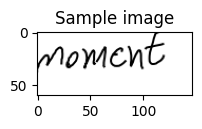

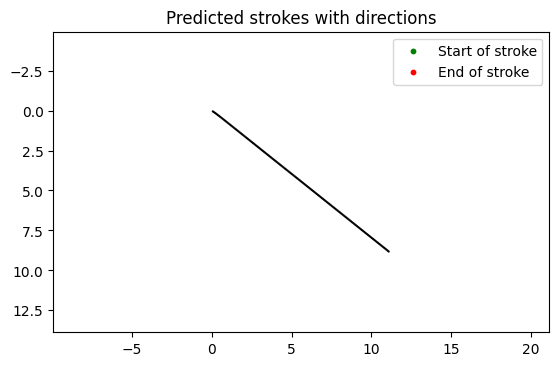

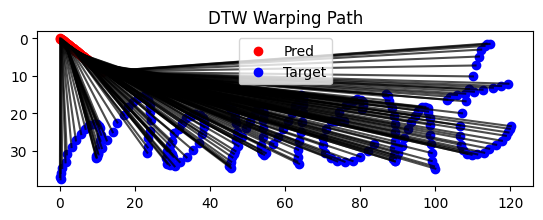

Epoch 1:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 519.5601
   Batch: 100  | Width: 46  | Loss: 337.8292
   Batch: 200  | Width: 56  | Loss: 301.9936
   Batch: 300  | Width: 64  | Loss: 308.8364
   Batch: 400  | Width: 72  | Loss: 284.5254
   Batch: 500  | Width: 78  | Loss: 291.3902
   Batch: 600  | Width: 84  | Loss: 304.4765
   Batch: 700  | Width: 90  | Loss: 376.3696
   Batch: 800  | Width: 96  | Loss: 328.2612
Image id: 10599


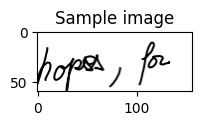

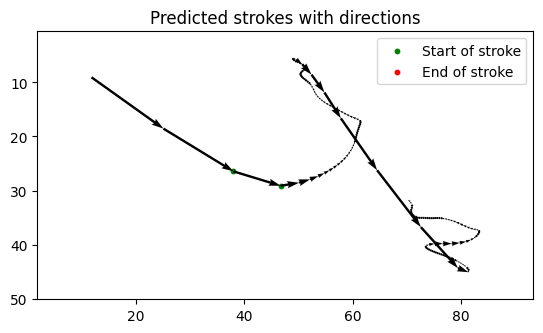

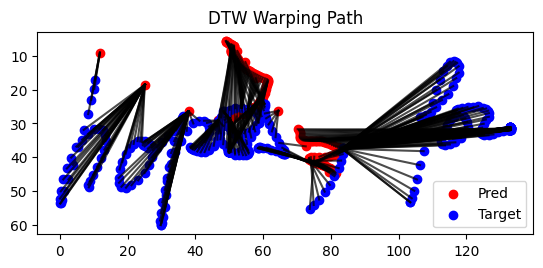

Epoch 2:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 523.8592
   Batch: 100  | Width: 46  | Loss: 310.9490
   Batch: 200  | Width: 56  | Loss: 322.0695
   Batch: 300  | Width: 64  | Loss: 251.6092
   Batch: 400  | Width: 72  | Loss: 277.8983
   Batch: 500  | Width: 78  | Loss: 254.1382
   Batch: 600  | Width: 84  | Loss: 291.9510
   Batch: 700  | Width: 90  | Loss: 325.5038
   Batch: 800  | Width: 96  | Loss: 354.0720
Image id: 16592


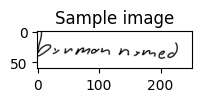

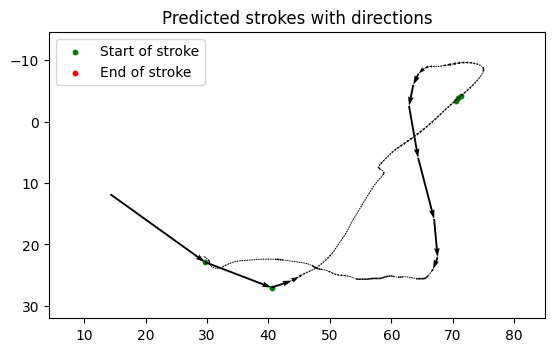

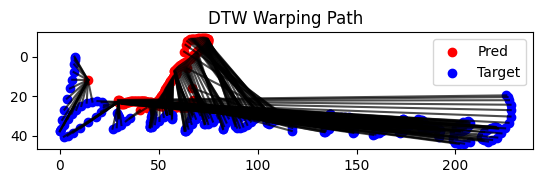

Epoch 3:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 409.6380
   Batch: 100  | Width: 46  | Loss: 297.1551
   Batch: 200  | Width: 56  | Loss: 308.5318
   Batch: 300  | Width: 64  | Loss: 242.3651
   Batch: 400  | Width: 72  | Loss: 294.0698
   Batch: 500  | Width: 78  | Loss: 275.6307
   Batch: 600  | Width: 84  | Loss: 268.1860
   Batch: 700  | Width: 90  | Loss: 338.4841
   Batch: 800  | Width: 96  | Loss: 309.1816
Image id: 2540


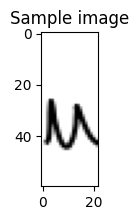

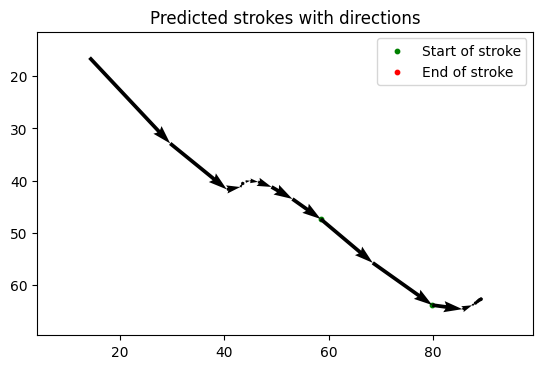

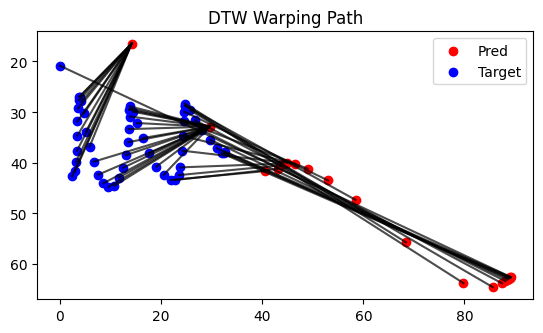

Epoch 4:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 325.7971
   Batch: 100  | Width: 46  | Loss: 287.8508
   Batch: 200  | Width: 56  | Loss: 293.2831
   Batch: 300  | Width: 64  | Loss: 263.9132
   Batch: 400  | Width: 72  | Loss: 272.3594
   Batch: 500  | Width: 78  | Loss: 254.9326
   Batch: 600  | Width: 84  | Loss: 258.5839
   Batch: 700  | Width: 90  | Loss: 346.8452
   Batch: 800  | Width: 96  | Loss: 368.9378
Image id: 39230


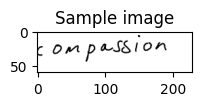

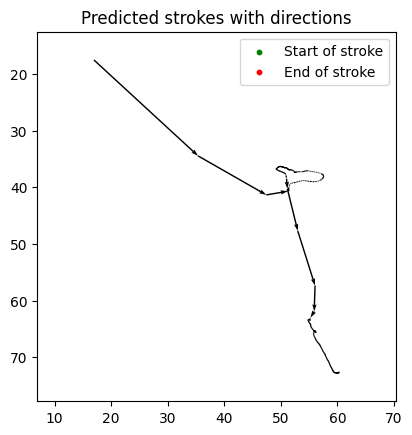

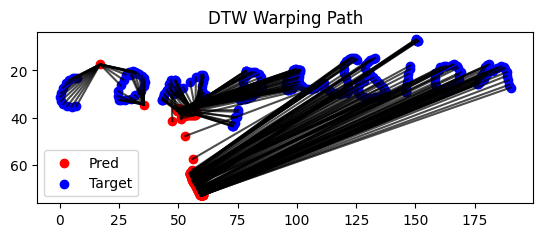

Epoch 5:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 273.2912
   Batch: 100  | Width: 46  | Loss: 293.4128
   Batch: 200  | Width: 56  | Loss: 269.7928
   Batch: 300  | Width: 64  | Loss: 257.4496
   Batch: 400  | Width: 72  | Loss: 286.9124
   Batch: 500  | Width: 78  | Loss: 233.0651
   Batch: 600  | Width: 84  | Loss: 272.3829
   Batch: 700  | Width: 90  | Loss: 307.3891
   Batch: 800  | Width: 96  | Loss: 338.8115
Image id: 15828


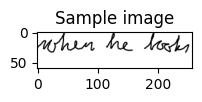

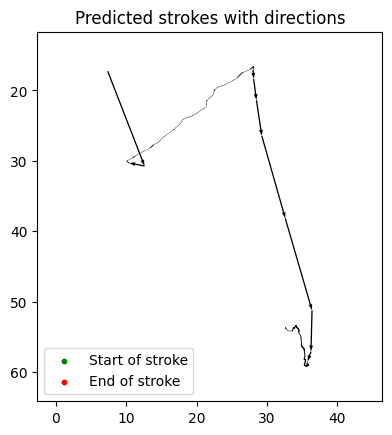

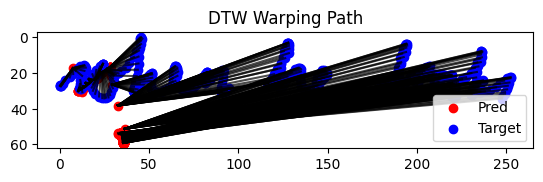

Epoch 6:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 242.6612
   Batch: 100  | Width: 46  | Loss: 285.6121
   Batch: 200  | Width: 56  | Loss: 288.9106
   Batch: 300  | Width: 64  | Loss: 242.6250
   Batch: 400  | Width: 72  | Loss: 299.7206
   Batch: 500  | Width: 78  | Loss: 263.3223
   Batch: 600  | Width: 84  | Loss: 256.1686
   Batch: 700  | Width: 90  | Loss: 309.7852
   Batch: 800  | Width: 96  | Loss: 314.6418
Image id: 12991


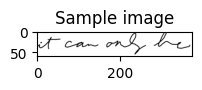

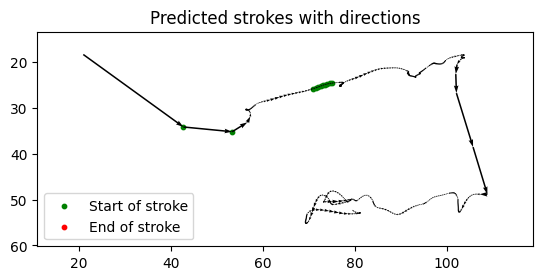

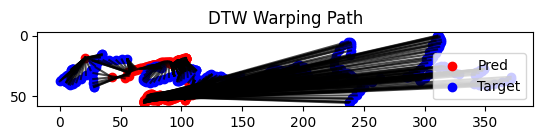

Epoch 7:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 218.5486
   Batch: 100  | Width: 46  | Loss: 306.8116
   Batch: 200  | Width: 56  | Loss: 275.6463
   Batch: 300  | Width: 64  | Loss: 266.3299
   Batch: 400  | Width: 72  | Loss: 275.8816
   Batch: 500  | Width: 78  | Loss: 249.6147
   Batch: 600  | Width: 84  | Loss: 249.1011
   Batch: 700  | Width: 90  | Loss: 312.8998
   Batch: 800  | Width: 96  | Loss: 300.9917
Image id: 9372


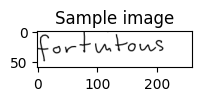

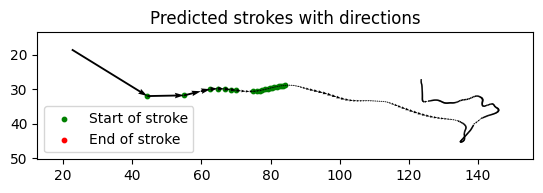

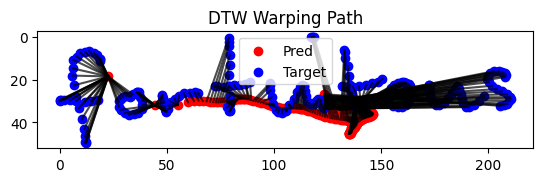

Epoch 8:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 195.0646
   Batch: 100  | Width: 46  | Loss: 294.2313
   Batch: 200  | Width: 56  | Loss: 274.7000
   Batch: 300  | Width: 64  | Loss: 280.9926
   Batch: 400  | Width: 72  | Loss: 287.3167
   Batch: 500  | Width: 78  | Loss: 252.4527
   Batch: 600  | Width: 84  | Loss: 244.1145
   Batch: 700  | Width: 90  | Loss: 300.4996
   Batch: 800  | Width: 96  | Loss: 305.3069
Image id: 13552


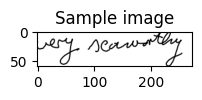

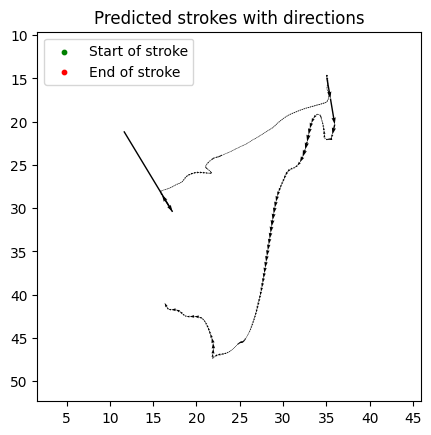

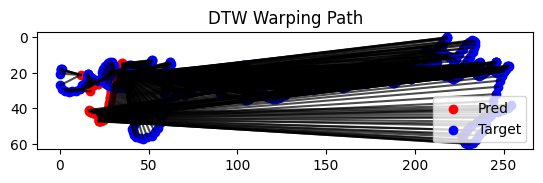

Epoch 9:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 230.4096
   Batch: 100  | Width: 46  | Loss: 302.8468
   Batch: 200  | Width: 56  | Loss: 268.0190
   Batch: 300  | Width: 64  | Loss: 250.1151
   Batch: 400  | Width: 72  | Loss: 280.2659
   Batch: 500  | Width: 78  | Loss: 244.0336
   Batch: 600  | Width: 84  | Loss: 255.0846
   Batch: 700  | Width: 90  | Loss: 311.6928
   Batch: 800  | Width: 96  | Loss: 313.6423
Image id: 37498


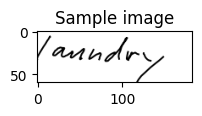

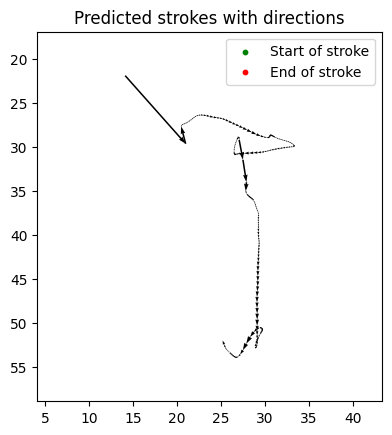

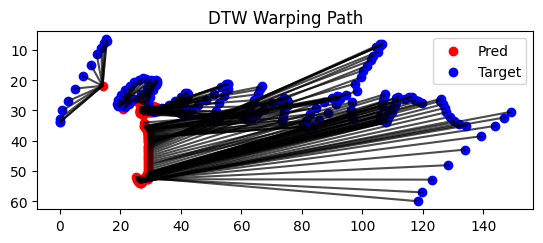

Epoch 10:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 178.3455
   Batch: 100  | Width: 46  | Loss: 289.7122
   Batch: 200  | Width: 56  | Loss: 264.0797
   Batch: 300  | Width: 64  | Loss: 240.6657
   Batch: 400  | Width: 72  | Loss: 274.5244
   Batch: 500  | Width: 78  | Loss: 260.8418
   Batch: 600  | Width: 84  | Loss: 244.5470
   Batch: 700  | Width: 90  | Loss: 288.5822
   Batch: 800  | Width: 96  | Loss: 303.7896
Image id: 13578


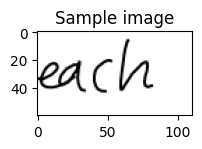

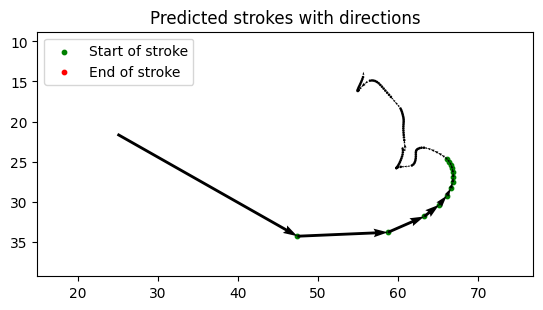

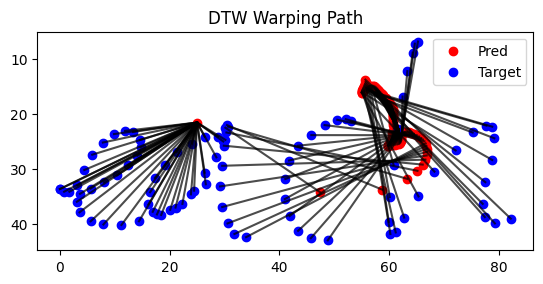

Epoch 11:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 173.4197
   Batch: 100  | Width: 46  | Loss: 293.5216
   Batch: 200  | Width: 56  | Loss: 267.3626
   Batch: 300  | Width: 64  | Loss: 250.0077
   Batch: 400  | Width: 72  | Loss: 281.0812
   Batch: 500  | Width: 78  | Loss: 233.7731
   Batch: 600  | Width: 84  | Loss: 229.7899
   Batch: 700  | Width: 90  | Loss: 295.1673
   Batch: 800  | Width: 96  | Loss: 323.9876
Image id: 34588


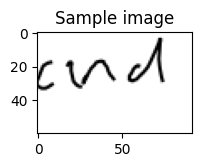

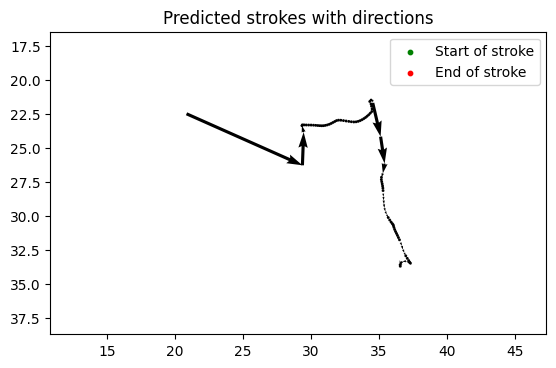

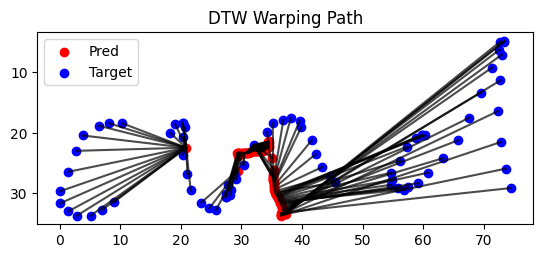

Epoch 12:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 195.5328
   Batch: 100  | Width: 46  | Loss: 293.3002
   Batch: 200  | Width: 56  | Loss: 266.3466
   Batch: 300  | Width: 64  | Loss: 259.7576
   Batch: 400  | Width: 72  | Loss: 287.5128
   Batch: 500  | Width: 78  | Loss: 234.5225
   Batch: 600  | Width: 84  | Loss: 226.6450
   Batch: 700  | Width: 90  | Loss: 293.7494
   Batch: 800  | Width: 96  | Loss: 308.3807
Image id: 30526


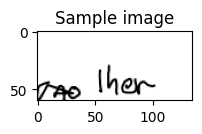

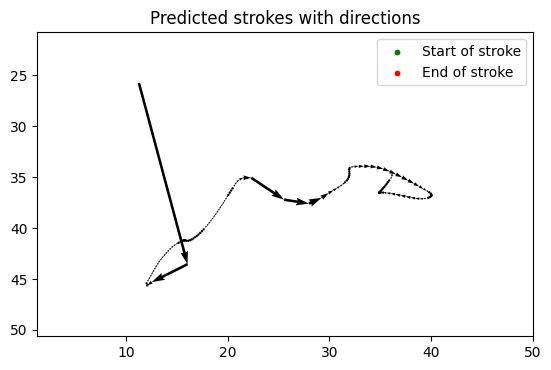

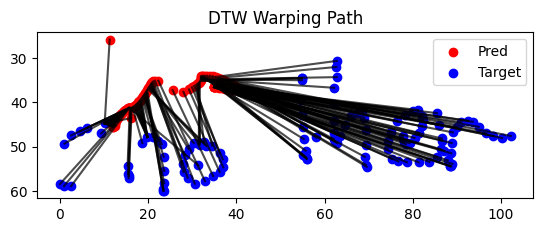

Epoch 13:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 178.5154
   Batch: 100  | Width: 46  | Loss: 296.2887
   Batch: 200  | Width: 56  | Loss: 258.4392
   Batch: 300  | Width: 64  | Loss: 259.9684
   Batch: 400  | Width: 72  | Loss: 274.2478
   Batch: 500  | Width: 78  | Loss: 225.6928
   Batch: 600  | Width: 84  | Loss: 227.8974
   Batch: 700  | Width: 90  | Loss: 285.3832
   Batch: 300  | Width: 64  | Loss: 259.3357
   Batch: 400  | Width: 72  | Loss: 281.6505
   Batch: 500  | Width: 78  | Loss: 238.0474
   Batch: 600  | Width: 84  | Loss: 244.3989
   Batch: 700  | Width: 90  | Loss: 297.9019
   Batch: 800  | Width: 96  | Loss: 298.4434
Image id: 17544


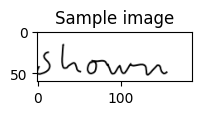

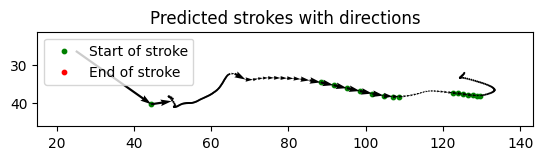

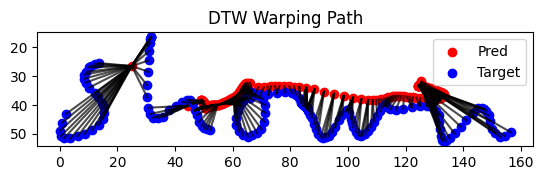

Epoch 15:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 174.4278
   Batch: 100  | Width: 46  | Loss: 289.2667
   Batch: 200  | Width: 56  | Loss: 251.4652
   Batch: 300  | Width: 64  | Loss: 237.2012
   Batch: 400  | Width: 72  | Loss: 278.1262
   Batch: 500  | Width: 78  | Loss: 233.7642
   Batch: 600  | Width: 84  | Loss: 243.2129
   Batch: 700  | Width: 90  | Loss: 310.1379
   Batch: 800  | Width: 96  | Loss: 311.5238
Image id: 34663


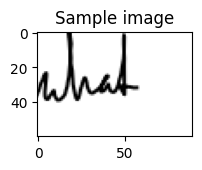

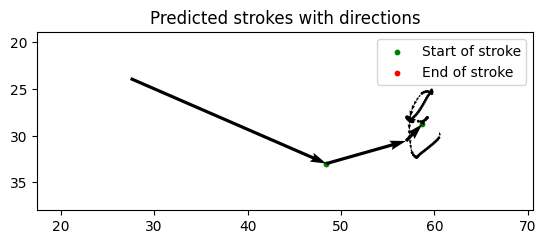

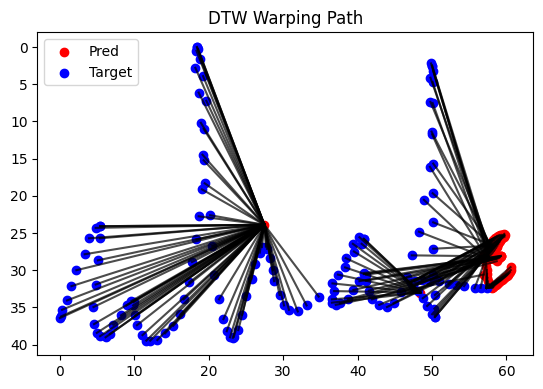

Epoch 16:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 180.5079
   Batch: 100  | Width: 46  | Loss: 289.6862
   Batch: 200  | Width: 56  | Loss: 264.6706
   Batch: 300  | Width: 64  | Loss: 246.6088
   Batch: 400  | Width: 72  | Loss: 267.7611
   Batch: 500  | Width: 78  | Loss: 236.4217
   Batch: 600  | Width: 84  | Loss: 251.5468
   Batch: 700  | Width: 90  | Loss: 292.2827
   Batch: 800  | Width: 96  | Loss: 317.0763
Image id: 30818


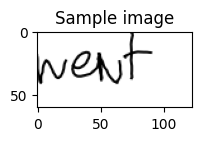

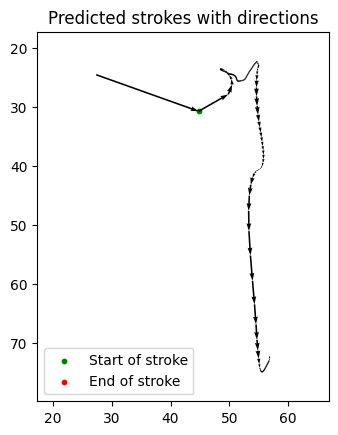

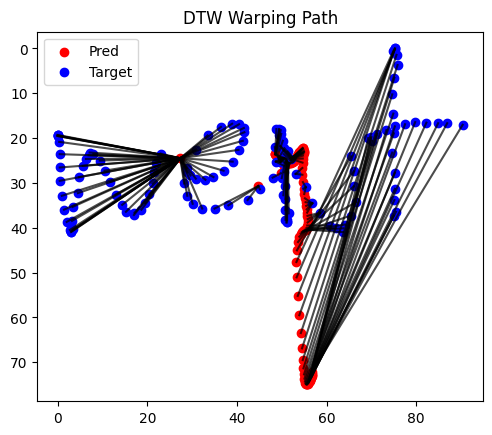

Epoch 17:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 175.2303
   Batch: 100  | Width: 46  | Loss: 292.0409
   Batch: 200  | Width: 56  | Loss: 262.5778
   Batch: 300  | Width: 64  | Loss: 241.1530
   Batch: 400  | Width: 72  | Loss: 290.3012
   Batch: 500  | Width: 78  | Loss: 229.0793
   Batch: 600  | Width: 84  | Loss: 228.1670
   Batch: 700  | Width: 90  | Loss: 285.6643
   Batch: 800  | Width: 96  | Loss: 323.2018
Image id: 4772


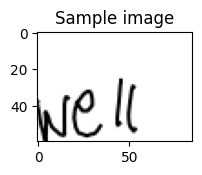

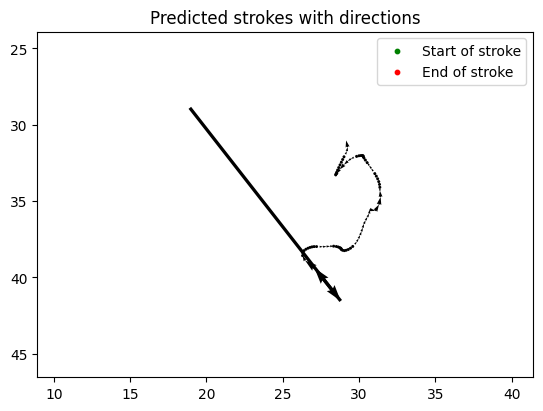

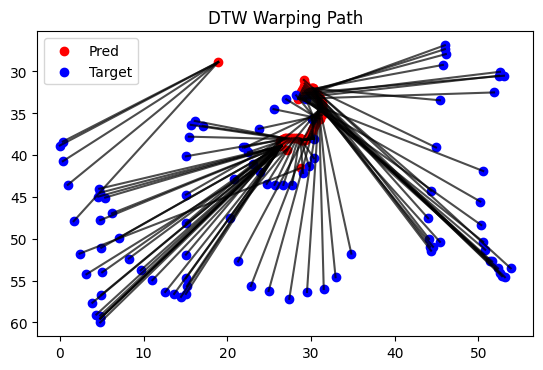

Epoch 18:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 166.3993
   Batch: 100  | Width: 46  | Loss: 283.4953
   Batch: 200  | Width: 56  | Loss: 264.7792
   Batch: 300  | Width: 64  | Loss: 231.8330
   Batch: 400  | Width: 72  | Loss: 273.6775
   Batch: 500  | Width: 78  | Loss: 226.6961
   Batch: 600  | Width: 84  | Loss: 232.6574
   Batch: 700  | Width: 90  | Loss: 289.9210
   Batch: 800  | Width: 96  | Loss: 326.5803
Image id: 11310


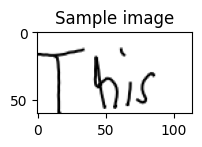

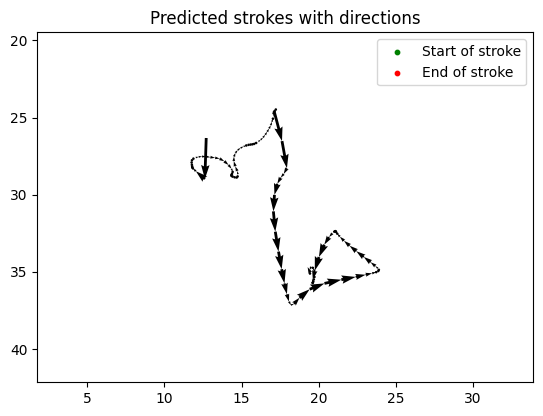

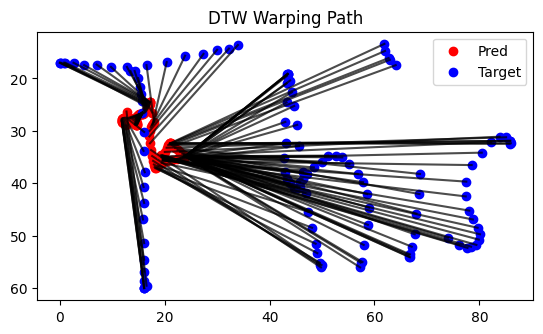

Epoch 19:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 177.8555
   Batch: 100  | Width: 46  | Loss: 282.9040
   Batch: 200  | Width: 56  | Loss: 275.5459
   Batch: 300  | Width: 64  | Loss: 230.7491
   Batch: 400  | Width: 72  | Loss: 280.6532
   Batch: 500  | Width: 78  | Loss: 226.8471
   Batch: 600  | Width: 84  | Loss: 244.7712
   Batch: 700  | Width: 90  | Loss: 296.8623
   Batch: 800  | Width: 96  | Loss: 322.7013
Image id: 35625


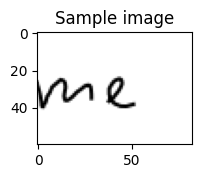

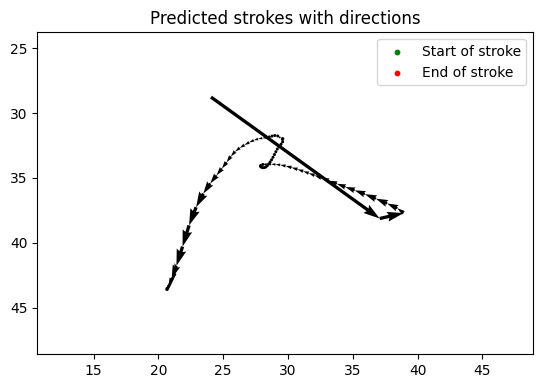

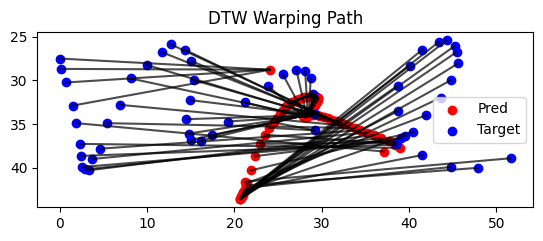

Epoch 20:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 159.2572
   Batch: 100  | Width: 46  | Loss: 291.7339
   Batch: 200  | Width: 56  | Loss: 245.9736
   Batch: 300  | Width: 64  | Loss: 243.1033
   Batch: 400  | Width: 72  | Loss: 259.7515
   Batch: 500  | Width: 78  | Loss: 217.5538
   Batch: 600  | Width: 84  | Loss: 237.0374
   Batch: 700  | Width: 90  | Loss: 299.4641
   Batch: 800  | Width: 96  | Loss: 323.4669
Image id: 37853


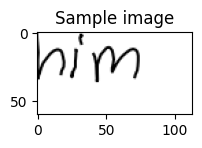

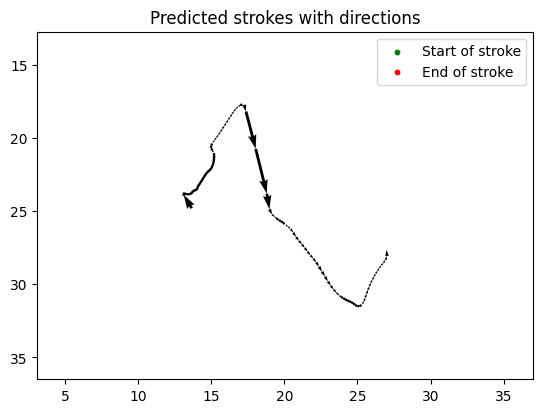

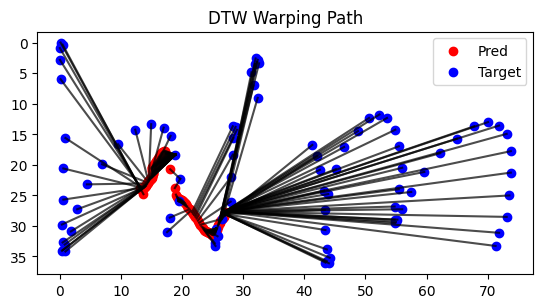

Epoch 21:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 166.3934
   Batch: 100  | Width: 46  | Loss: 279.1680
   Batch: 200  | Width: 56  | Loss: 255.5030
   Batch: 300  | Width: 64  | Loss: 236.4976
   Batch: 400  | Width: 72  | Loss: 280.0610
   Batch: 500  | Width: 78  | Loss: 216.2871
   Batch: 600  | Width: 84  | Loss: 233.9020
   Batch: 700  | Width: 90  | Loss: 299.0125
   Batch: 800  | Width: 96  | Loss: 314.6275
Image id: 26942


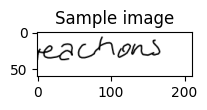

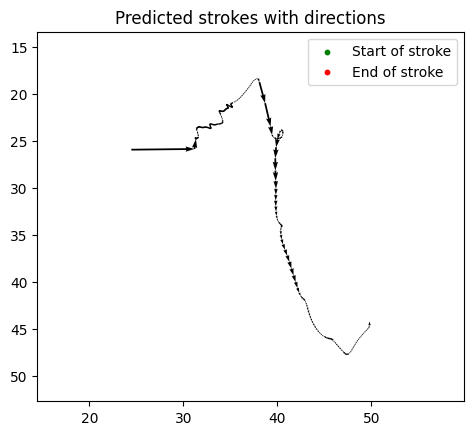

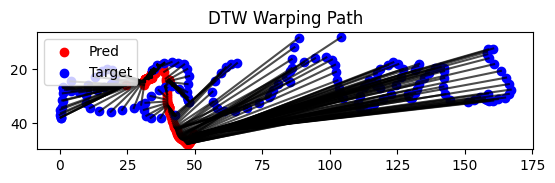

Epoch 22:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 158.8183
   Batch: 100  | Width: 46  | Loss: 280.7526
   Batch: 200  | Width: 56  | Loss: 260.4988
   Batch: 300  | Width: 64  | Loss: 243.4976
   Batch: 400  | Width: 72  | Loss: 277.6560
   Batch: 500  | Width: 78  | Loss: 223.0351
   Batch: 600  | Width: 84  | Loss: 233.6911
   Batch: 700  | Width: 90  | Loss: 299.0479
   Batch: 800  | Width: 96  | Loss: 315.0570
Image id: 6325


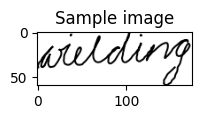

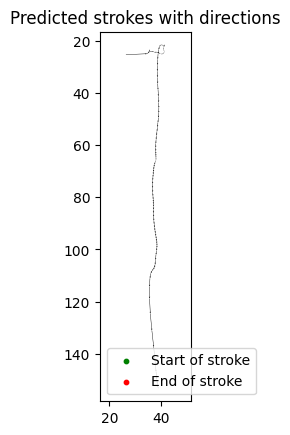

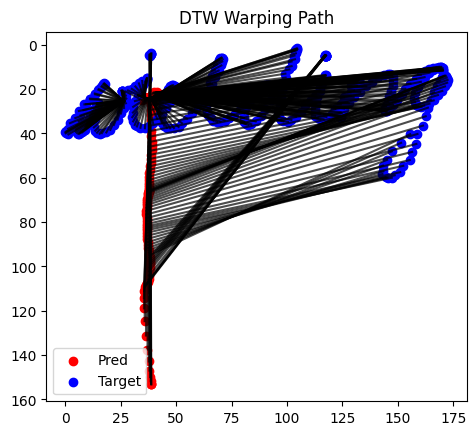

Epoch 23:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 157.2185
   Batch: 100  | Width: 46  | Loss: 279.4237
   Batch: 200  | Width: 56  | Loss: 254.1192
   Batch: 300  | Width: 64  | Loss: 248.5661
   Batch: 400  | Width: 72  | Loss: 273.5735
   Batch: 500  | Width: 78  | Loss: 218.1048
   Batch: 600  | Width: 84  | Loss: 227.2675
   Batch: 700  | Width: 90  | Loss: 294.2833
   Batch: 800  | Width: 96  | Loss: 309.0208
Image id: 16936


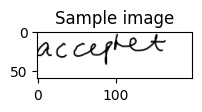

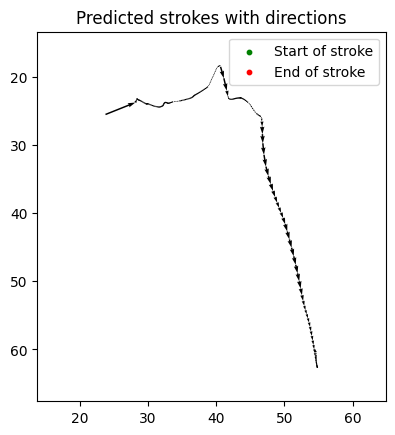

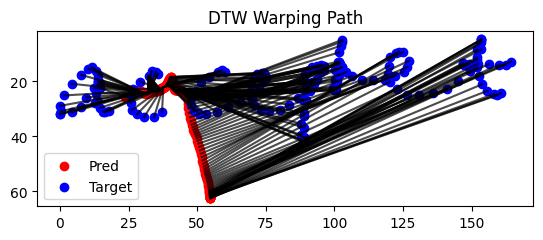

Epoch 24:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 165.7776
   Batch: 100  | Width: 46  | Loss: 270.4444
   Batch: 200  | Width: 56  | Loss: 262.2554
   Batch: 300  | Width: 64  | Loss: 233.1135
   Batch: 400  | Width: 72  | Loss: 271.4580
   Batch: 500  | Width: 78  | Loss: 217.7377
   Batch: 600  | Width: 84  | Loss: 226.5615
   Batch: 700  | Width: 90  | Loss: 299.2134
   Batch: 800  | Width: 96  | Loss: 321.7262
Image id: 17659


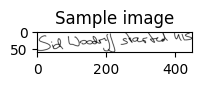

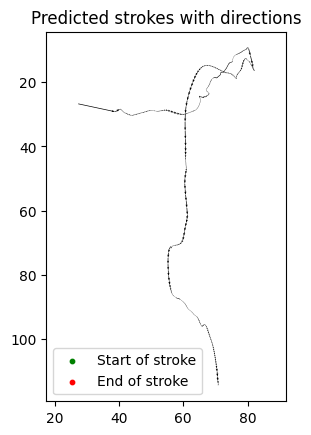

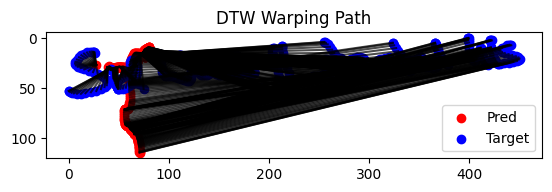

Epoch 25:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 156.6526
   Batch: 100  | Width: 46  | Loss: 281.6398
   Batch: 200  | Width: 56  | Loss: 248.0962
   Batch: 300  | Width: 64  | Loss: 245.2431
   Batch: 400  | Width: 72  | Loss: 270.2672
   Batch: 500  | Width: 78  | Loss: 208.9107
   Batch: 600  | Width: 84  | Loss: 229.2925
   Batch: 700  | Width: 90  | Loss: 300.9276
   Batch: 800  | Width: 96  | Loss: 293.8517
Image id: 2623


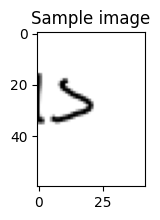

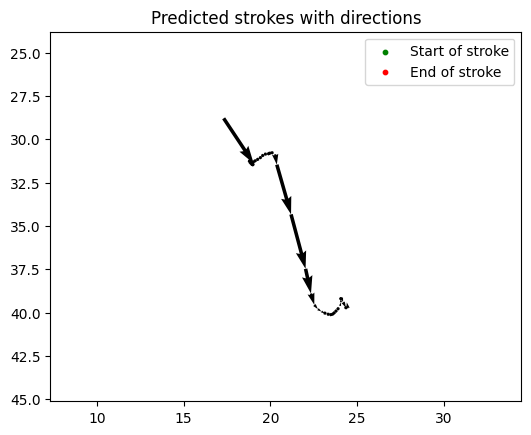

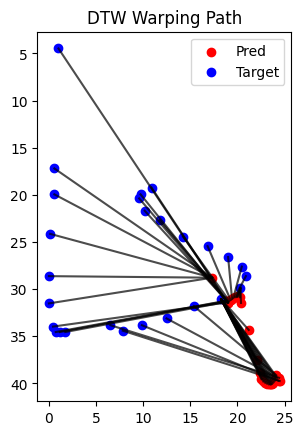

Epoch 26:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 166.2332
   Batch: 100  | Width: 46  | Loss: 278.4474
   Batch: 200  | Width: 56  | Loss: 252.9927
   Batch: 300  | Width: 64  | Loss: 233.3641
   Batch: 400  | Width: 72  | Loss: 275.7124
   Batch: 500  | Width: 78  | Loss: 226.9395
   Batch: 600  | Width: 84  | Loss: 223.2693
   Batch: 700  | Width: 90  | Loss: 288.5038
   Batch: 800  | Width: 96  | Loss: 292.8065
Image id: 39931


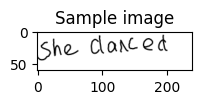

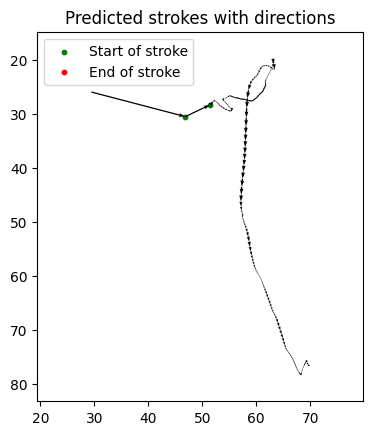

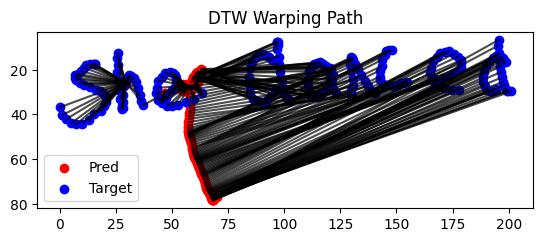

Epoch 27:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 160.8187
   Batch: 100  | Width: 46  | Loss: 276.7746
   Batch: 200  | Width: 56  | Loss: 256.1937
   Batch: 300  | Width: 64  | Loss: 246.2994
   Batch: 400  | Width: 72  | Loss: 266.8412
   Batch: 500  | Width: 78  | Loss: 220.5574
   Batch: 600  | Width: 84  | Loss: 227.5388
   Batch: 700  | Width: 90  | Loss: 293.7652
   Batch: 800  | Width: 96  | Loss: 302.6635
Image id: 14859


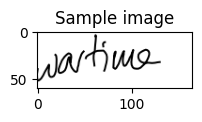

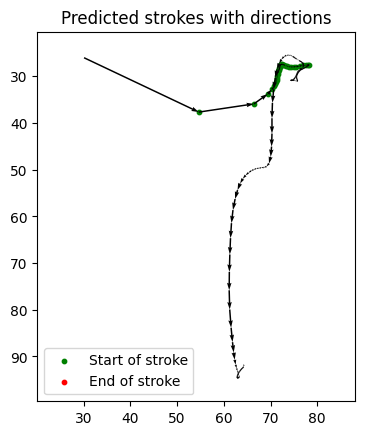

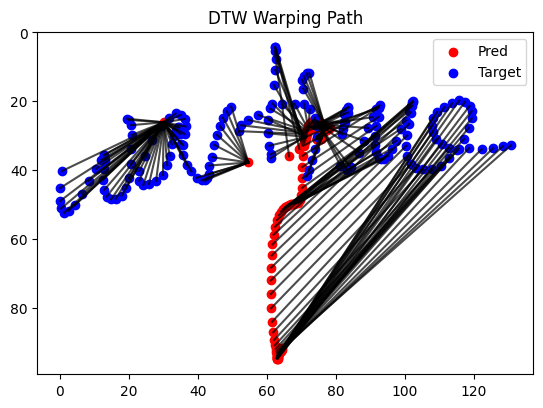

Epoch 28:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 156.8815
   Batch: 100  | Width: 46  | Loss: 276.3512
   Batch: 200  | Width: 56  | Loss: 261.7777
   Batch: 300  | Width: 64  | Loss: 246.1420
   Batch: 400  | Width: 72  | Loss: 271.8278
   Batch: 500  | Width: 78  | Loss: 227.3570
   Batch: 600  | Width: 84  | Loss: 223.0656
   Batch: 700  | Width: 90  | Loss: 283.9333
   Batch: 800  | Width: 96  | Loss: 301.7166
Image id: 13243


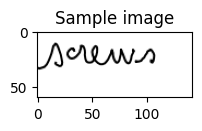

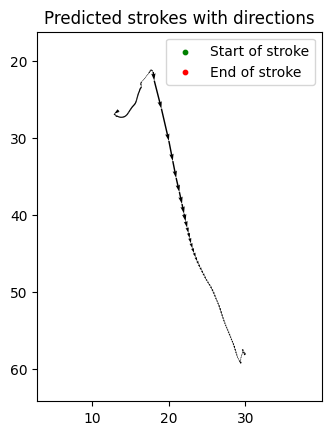

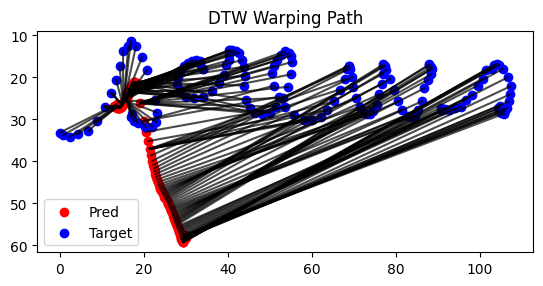

Epoch 29:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 160.2116
   Batch: 100  | Width: 46  | Loss: 275.3914
   Batch: 200  | Width: 56  | Loss: 255.9856
   Batch: 300  | Width: 64  | Loss: 242.3782
   Batch: 400  | Width: 72  | Loss: 272.7053
   Batch: 500  | Width: 78  | Loss: 220.7467
   Batch: 600  | Width: 84  | Loss: 228.8750
   Batch: 700  | Width: 90  | Loss: 286.1465
   Batch: 800  | Width: 96  | Loss: 300.9989
Image id: 26064


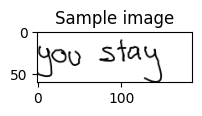

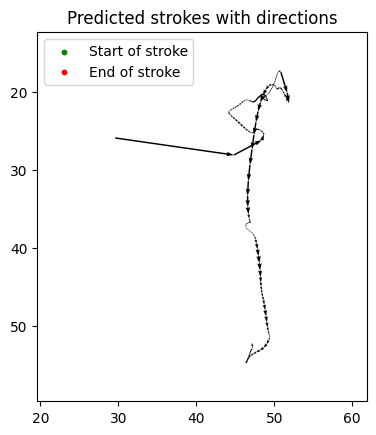

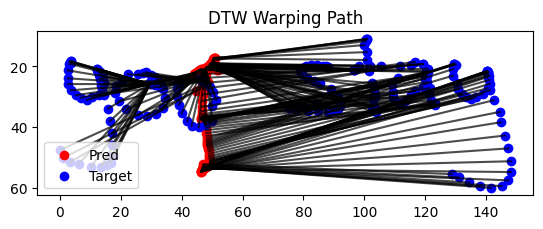

Epoch 30:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 154.7581
   Batch: 100  | Width: 46  | Loss: 275.2727
   Batch: 200  | Width: 56  | Loss: 259.7375
   Batch: 300  | Width: 64  | Loss: 240.3132
   Batch: 400  | Width: 72  | Loss: 267.9426
   Batch: 500  | Width: 78  | Loss: 220.4180
   Batch: 600  | Width: 84  | Loss: 217.8027
   Batch: 700  | Width: 90  | Loss: 290.4018
   Batch: 800  | Width: 96  | Loss: 329.1381
Image id: 35867


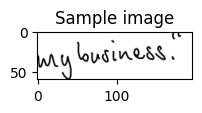

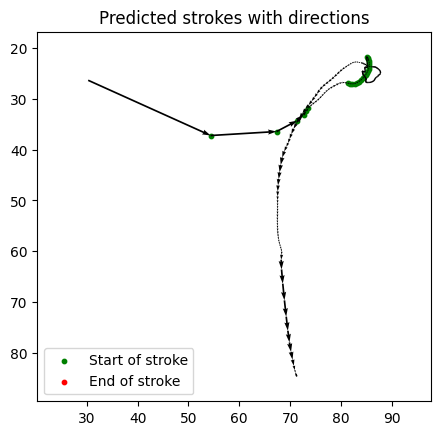

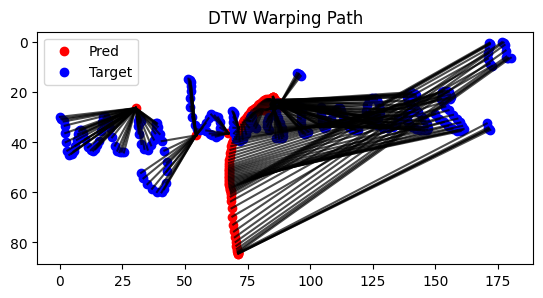

Epoch 31:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 157.2748
   Batch: 100  | Width: 46  | Loss: 281.8404
   Batch: 200  | Width: 56  | Loss: 244.9190
   Batch: 300  | Width: 64  | Loss: 250.5965
   Batch: 400  | Width: 72  | Loss: 280.8219
   Batch: 500  | Width: 78  | Loss: 215.1402
   Batch: 600  | Width: 84  | Loss: 235.9634
   Batch: 700  | Width: 90  | Loss: 287.2323
   Batch: 800  | Width: 96  | Loss: 304.5207
Image id: 8883


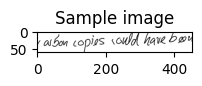

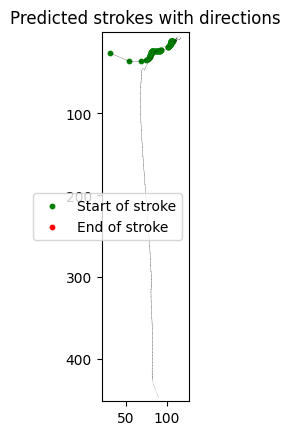

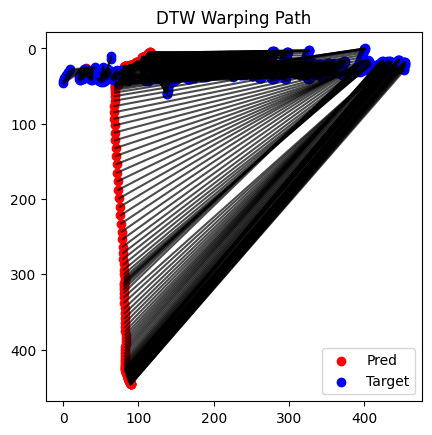

Epoch 32:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 155.8764
   Batch: 100  | Width: 46  | Loss: 273.6814
   Batch: 200  | Width: 56  | Loss: 244.9588
   Batch: 300  | Width: 64  | Loss: 244.5468
   Batch: 400  | Width: 72  | Loss: 271.3309
   Batch: 500  | Width: 78  | Loss: 210.6439
   Batch: 600  | Width: 84  | Loss: 227.8161
   Batch: 700  | Width: 90  | Loss: 283.0440
   Batch: 800  | Width: 96  | Loss: 299.4524
Image id: 14966


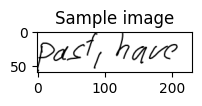

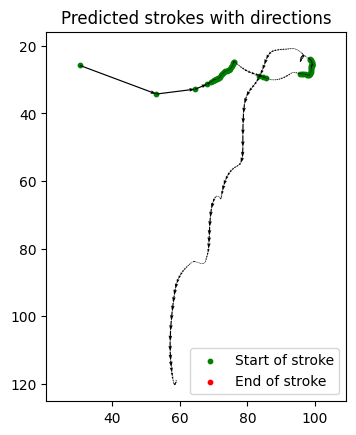

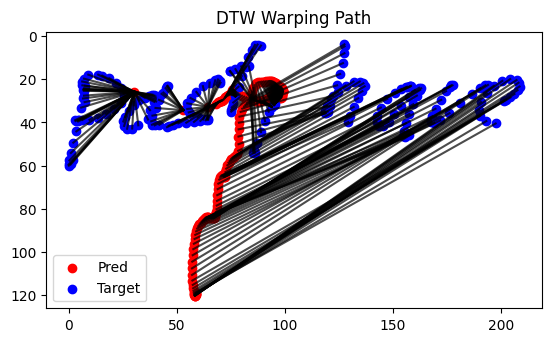

Epoch 33:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 157.1757
   Batch: 100  | Width: 46  | Loss: 275.9025
   Batch: 200  | Width: 56  | Loss: 273.4007
   Batch: 300  | Width: 64  | Loss: 245.4406
   Batch: 400  | Width: 72  | Loss: 278.6876
   Batch: 500  | Width: 78  | Loss: 217.7438
   Batch: 600  | Width: 84  | Loss: 230.5671
   Batch: 700  | Width: 90  | Loss: 290.5343
   Batch: 800  | Width: 96  | Loss: 300.3968
Image id: 1996


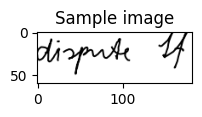

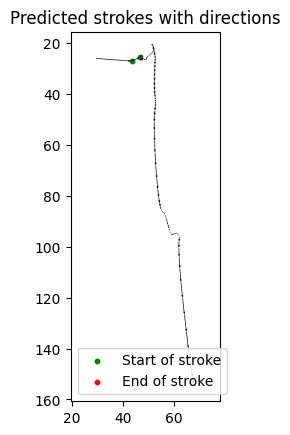

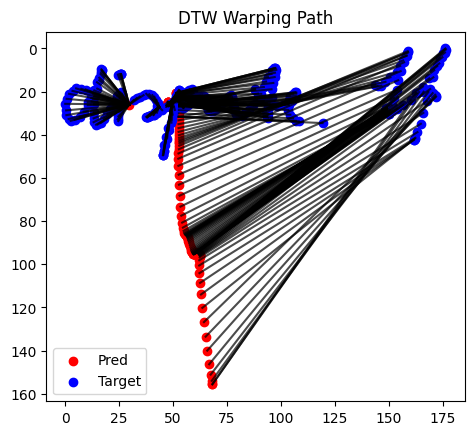

Epoch 34:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 151.9169
   Batch: 100  | Width: 46  | Loss: 268.1517
   Batch: 200  | Width: 56  | Loss: 259.9044
   Batch: 300  | Width: 64  | Loss: 237.5066
   Batch: 400  | Width: 72  | Loss: 264.0470
   Batch: 500  | Width: 78  | Loss: 220.9932
   Batch: 600  | Width: 84  | Loss: 224.2571
   Batch: 700  | Width: 90  | Loss: 291.0326
   Batch: 800  | Width: 96  | Loss: 310.7078
Image id: 19639


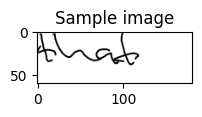

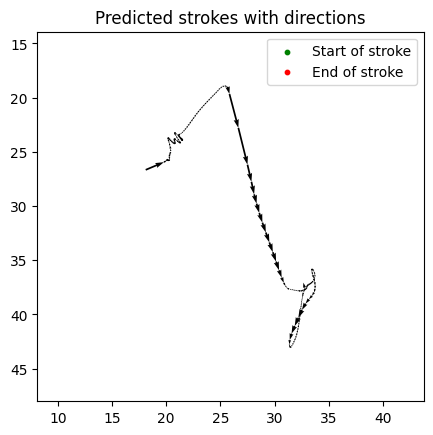

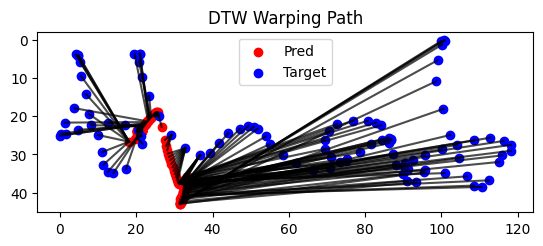

Epoch 35:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 157.4811
   Batch: 100  | Width: 46  | Loss: 279.5261
   Batch: 200  | Width: 56  | Loss: 258.8048
   Batch: 300  | Width: 64  | Loss: 244.3366
   Batch: 400  | Width: 72  | Loss: 269.3001
   Batch: 500  | Width: 78  | Loss: 214.8094
   Batch: 600  | Width: 84  | Loss: 227.3965
   Batch: 700  | Width: 90  | Loss: 287.1628
   Batch: 800  | Width: 96  | Loss: 305.3178
Image id: 17974


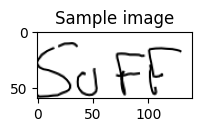

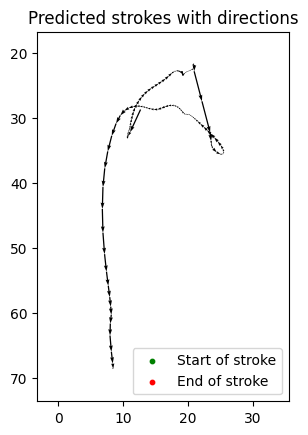

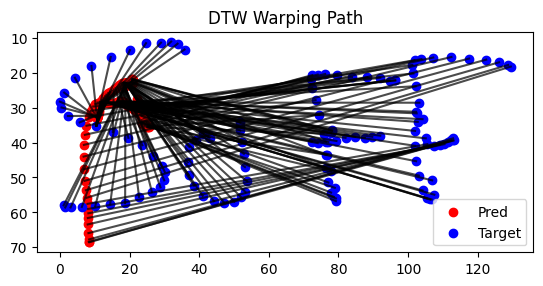

Epoch 36:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 152.4067
   Batch: 100  | Width: 46  | Loss: 269.8861
   Batch: 200  | Width: 56  | Loss: 256.9518
   Batch: 300  | Width: 64  | Loss: 242.2117
   Batch: 400  | Width: 72  | Loss: 271.2359
   Batch: 500  | Width: 78  | Loss: 205.8365
   Batch: 600  | Width: 84  | Loss: 214.4392
   Batch: 700  | Width: 90  | Loss: 292.4990
   Batch: 800  | Width: 96  | Loss: 299.1291
Image id: 34406


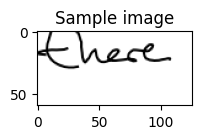

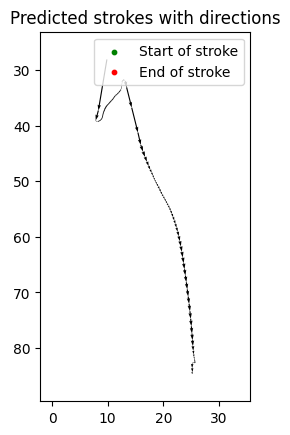

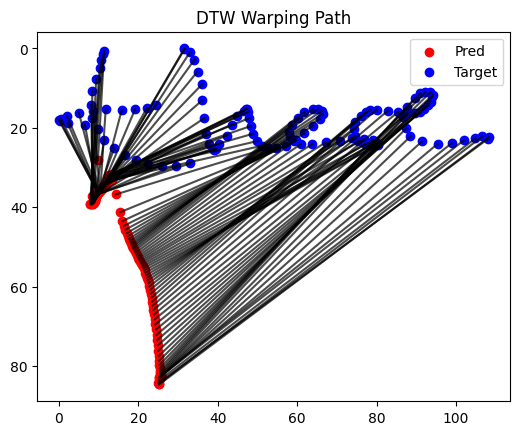

Epoch 37:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 155.9075
   Batch: 100  | Width: 46  | Loss: 271.7721
   Batch: 200  | Width: 56  | Loss: 269.9801
   Batch: 300  | Width: 64  | Loss: 248.0522
   Batch: 400  | Width: 72  | Loss: 276.1613
   Batch: 500  | Width: 78  | Loss: 223.8429
   Batch: 600  | Width: 84  | Loss: 232.9758
   Batch: 700  | Width: 90  | Loss: 280.3876
   Batch: 800  | Width: 96  | Loss: 293.7077
Image id: 35920


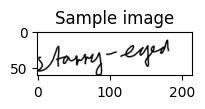

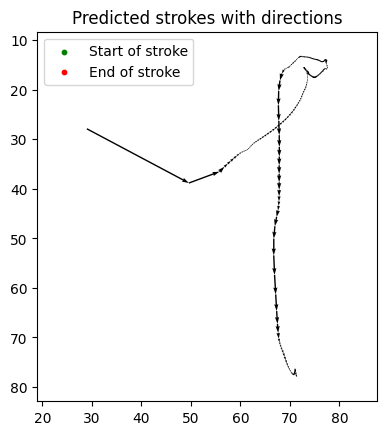

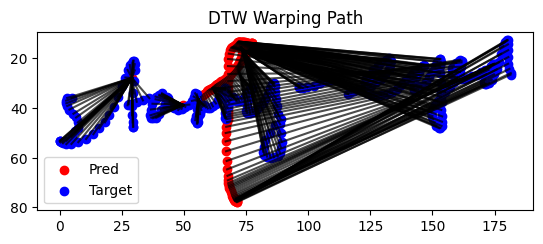

Epoch 38:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 150.5066
   Batch: 100  | Width: 46  | Loss: 261.2673
   Batch: 200  | Width: 56  | Loss: 264.3404
   Batch: 300  | Width: 64  | Loss: 241.9412
   Batch: 400  | Width: 72  | Loss: 269.4100
   Batch: 500  | Width: 78  | Loss: 215.1880
   Batch: 600  | Width: 84  | Loss: 223.7121
   Batch: 700  | Width: 90  | Loss: 275.9221
   Batch: 800  | Width: 96  | Loss: 317.9048
Image id: 34957


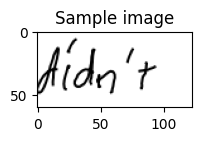

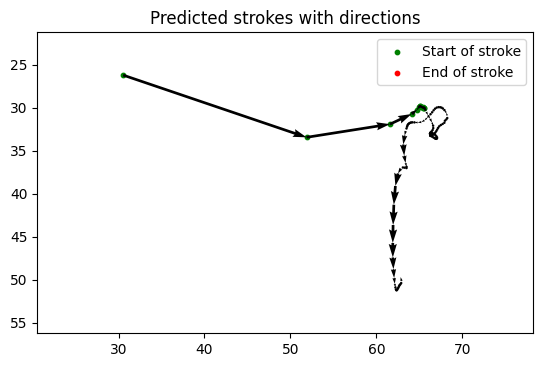

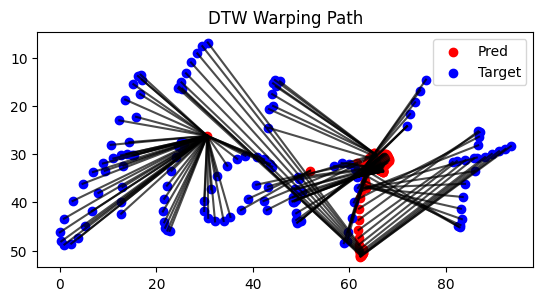

Epoch 39:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 155.1603
   Batch: 100  | Width: 46  | Loss: 274.0109
   Batch: 200  | Width: 56  | Loss: 256.7898
   Batch: 300  | Width: 64  | Loss: 238.4225
   Batch: 400  | Width: 72  | Loss: 272.0172
   Batch: 500  | Width: 78  | Loss: 215.9862
   Batch: 600  | Width: 84  | Loss: 223.5348
   Batch: 700  | Width: 90  | Loss: 285.4940
   Batch: 800  | Width: 96  | Loss: 304.0506
Image id: 3520


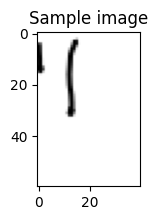

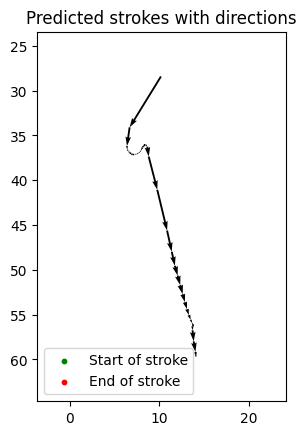

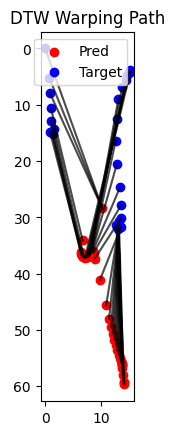

Epoch 40:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 154.4574
   Batch: 100  | Width: 46  | Loss: 279.2532
   Batch: 200  | Width: 56  | Loss: 260.0360
   Batch: 300  | Width: 64  | Loss: 231.7173
   Batch: 400  | Width: 72  | Loss: 272.7982
   Batch: 500  | Width: 78  | Loss: 231.3219
   Batch: 600  | Width: 84  | Loss: 222.6751
   Batch: 700  | Width: 90  | Loss: 280.9079
   Batch: 800  | Width: 96  | Loss: 330.4292
Image id: 416


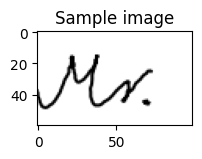

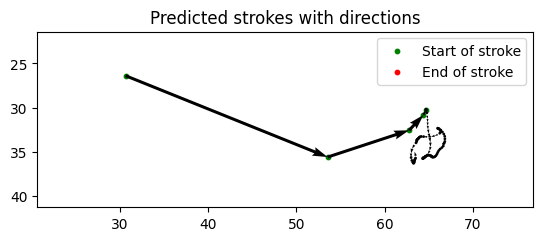

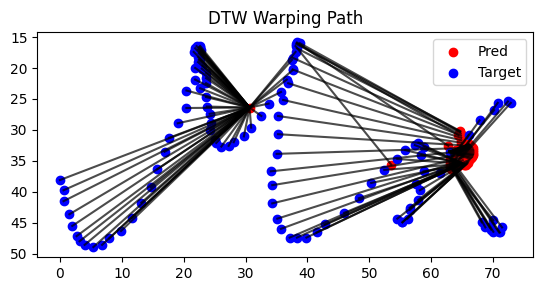

Epoch 41:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 154.1741
   Batch: 100  | Width: 46  | Loss: 265.5244
   Batch: 200  | Width: 56  | Loss: 251.1513
   Batch: 300  | Width: 64  | Loss: 239.4636
   Batch: 400  | Width: 72  | Loss: 271.9199
   Batch: 500  | Width: 78  | Loss: 219.7978
   Batch: 600  | Width: 84  | Loss: 229.6824
   Batch: 700  | Width: 90  | Loss: 291.3992
   Batch: 800  | Width: 96  | Loss: 310.0594
Image id: 28700


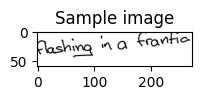

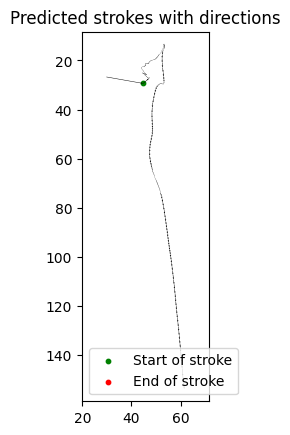

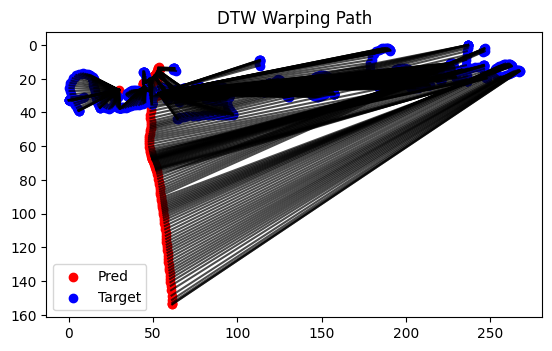

Epoch 42:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 151.9714
   Batch: 100  | Width: 46  | Loss: 263.3070
   Batch: 200  | Width: 56  | Loss: 263.2827
   Batch: 300  | Width: 64  | Loss: 242.0036
   Batch: 400  | Width: 72  | Loss: 273.1133
   Batch: 500  | Width: 78  | Loss: 222.6240
   Batch: 600  | Width: 84  | Loss: 219.6064
   Batch: 700  | Width: 90  | Loss: 283.1595
   Batch: 800  | Width: 96  | Loss: 292.8187
Image id: 23532


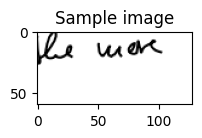

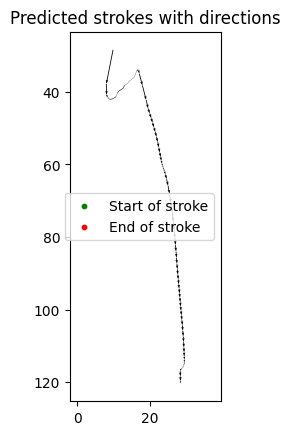

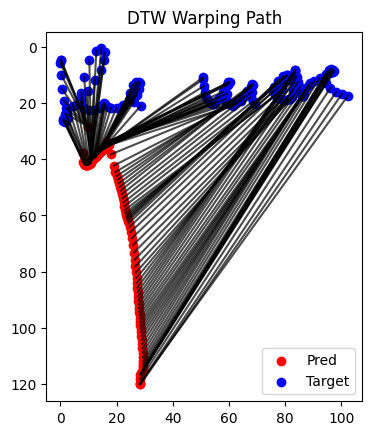

Epoch 43:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 153.5476
   Batch: 100  | Width: 46  | Loss: 259.2058
   Batch: 200  | Width: 56  | Loss: 269.7891
   Batch: 300  | Width: 64  | Loss: 240.2071
   Batch: 400  | Width: 72  | Loss: 277.9780
   Batch: 500  | Width: 78  | Loss: 219.1175
   Batch: 600  | Width: 84  | Loss: 216.6823
   Batch: 700  | Width: 90  | Loss: 275.6063
   Batch: 800  | Width: 96  | Loss: 297.4014
Image id: 10696


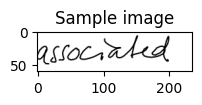

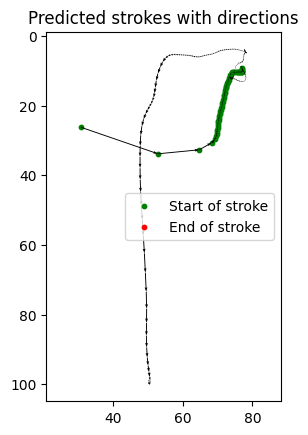

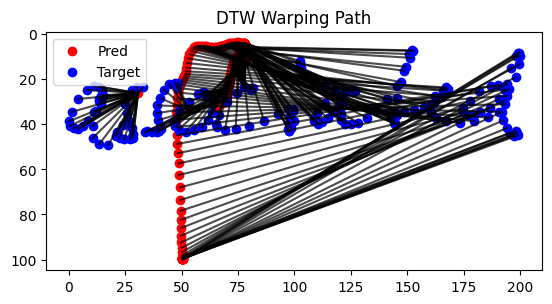

Epoch 44:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 152.1403
   Batch: 100  | Width: 46  | Loss: 264.9686
   Batch: 200  | Width: 56  | Loss: 249.0695
   Batch: 300  | Width: 64  | Loss: 246.8501
   Batch: 400  | Width: 72  | Loss: 264.6313
   Batch: 500  | Width: 78  | Loss: 218.0724
   Batch: 600  | Width: 84  | Loss: 226.5708
   Batch: 700  | Width: 90  | Loss: 288.5935
   Batch: 800  | Width: 96  | Loss: 288.8503
Image id: 29464


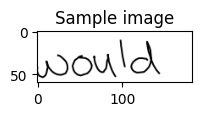

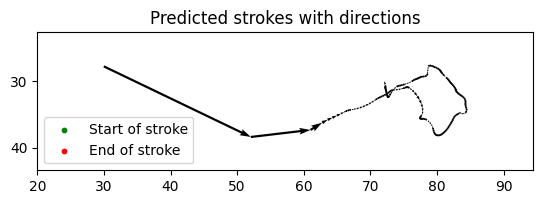

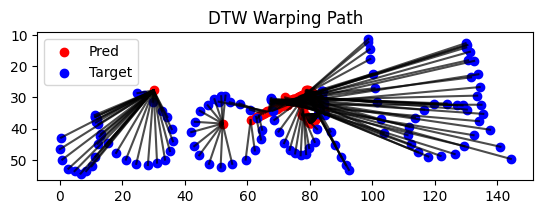

Epoch 45:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 149.7987
   Batch: 100  | Width: 46  | Loss: 273.3220
   Batch: 200  | Width: 56  | Loss: 249.8693
   Batch: 300  | Width: 64  | Loss: 238.8650
   Batch: 400  | Width: 72  | Loss: 272.5402
   Batch: 500  | Width: 78  | Loss: 218.0200
   Batch: 600  | Width: 84  | Loss: 220.6966
   Batch: 700  | Width: 90  | Loss: 286.3760
   Batch: 800  | Width: 96  | Loss: 278.2296
Image id: 33958


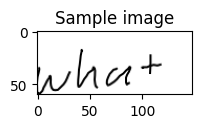

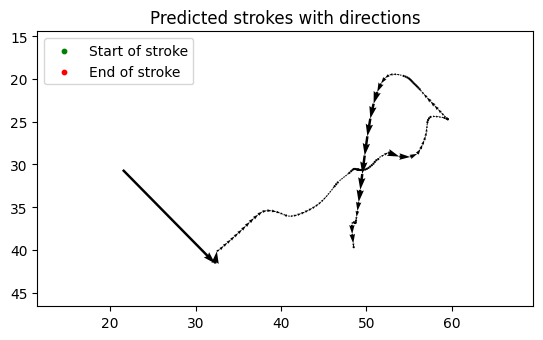

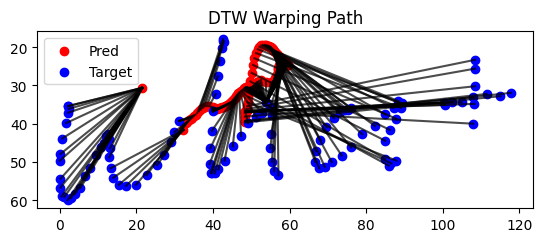

Epoch 46:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 150.5410
   Batch: 100  | Width: 46  | Loss: 270.2379
   Batch: 200  | Width: 56  | Loss: 262.7574
   Batch: 300  | Width: 64  | Loss: 242.5089
   Batch: 400  | Width: 72  | Loss: 265.0722
   Batch: 500  | Width: 78  | Loss: 218.6643
   Batch: 600  | Width: 84  | Loss: 232.3586
   Batch: 700  | Width: 90  | Loss: 283.4659
   Batch: 800  | Width: 96  | Loss: 291.6936
Image id: 19092


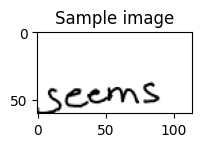

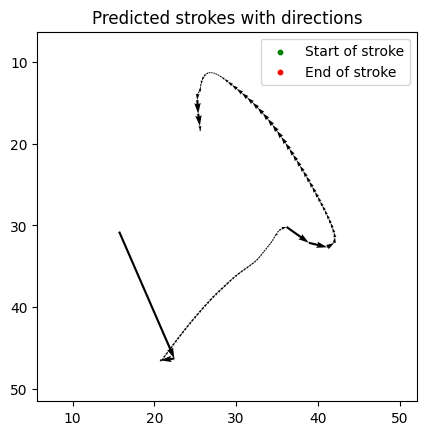

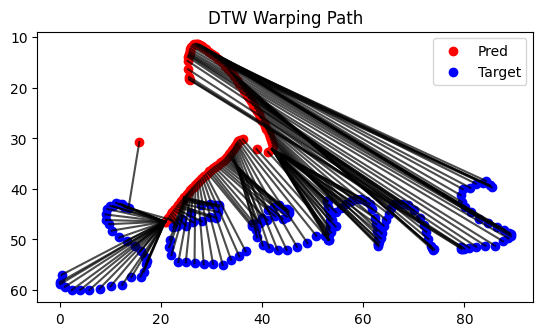

Epoch 47:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 152.6450
   Batch: 100  | Width: 46  | Loss: 270.1089
   Batch: 200  | Width: 56  | Loss: 252.3472
   Batch: 300  | Width: 64  | Loss: 244.1885
   Batch: 400  | Width: 72  | Loss: 268.3141
   Batch: 500  | Width: 78  | Loss: 209.1219
   Batch: 600  | Width: 84  | Loss: 222.6514
   Batch: 700  | Width: 90  | Loss: 272.5997
   Batch: 800  | Width: 96  | Loss: 292.4298
Image id: 38808


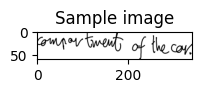

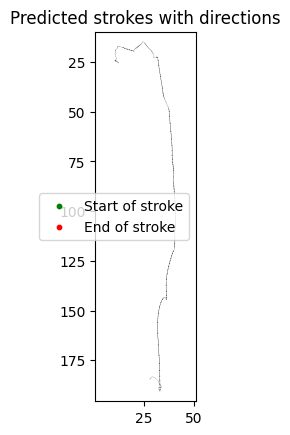

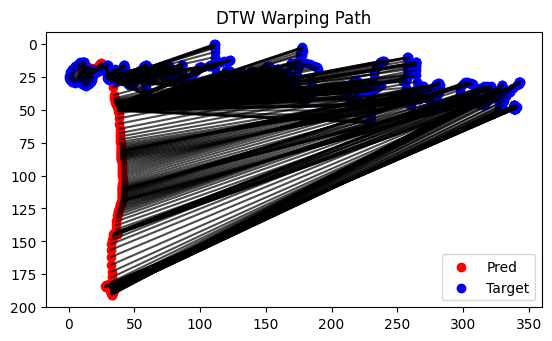

Epoch 48:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 153.7641
   Batch: 100  | Width: 46  | Loss: 270.2710
   Batch: 200  | Width: 56  | Loss: 266.4314
   Batch: 300  | Width: 64  | Loss: 236.9497
   Batch: 400  | Width: 72  | Loss: 269.5718
   Batch: 500  | Width: 78  | Loss: 212.2841
   Batch: 600  | Width: 84  | Loss: 222.4492
   Batch: 700  | Width: 90  | Loss: 275.3825
   Batch: 800  | Width: 96  | Loss: 285.2046
Image id: 642


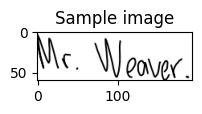

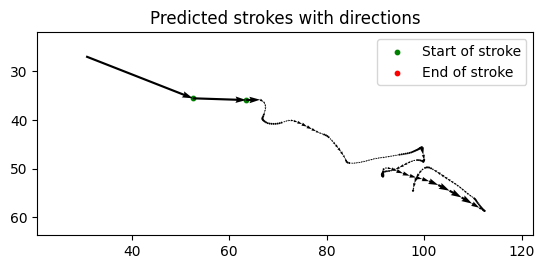

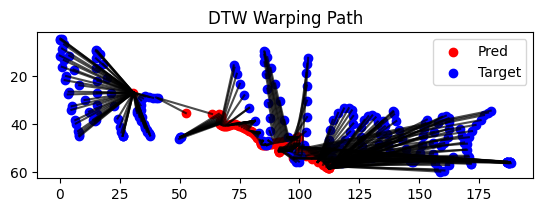

Epoch 49:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 147.8725
   Batch: 100  | Width: 46  | Loss: 255.0666
   Batch: 200  | Width: 56  | Loss: 261.7535
   Batch: 300  | Width: 64  | Loss: 244.0652
   Batch: 400  | Width: 72  | Loss: 277.9557
   Batch: 500  | Width: 78  | Loss: 212.3135
   Batch: 600  | Width: 84  | Loss: 220.0081
   Batch: 700  | Width: 90  | Loss: 278.3933
   Batch: 800  | Width: 96  | Loss: 302.5433
Image id: 30418


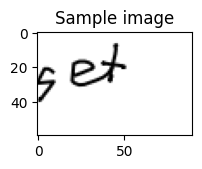

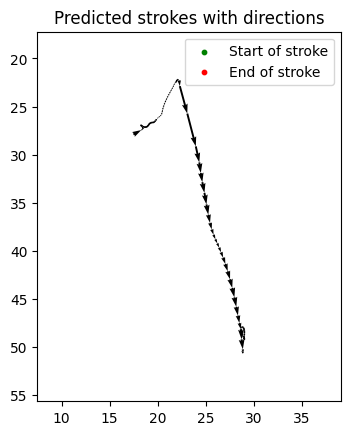

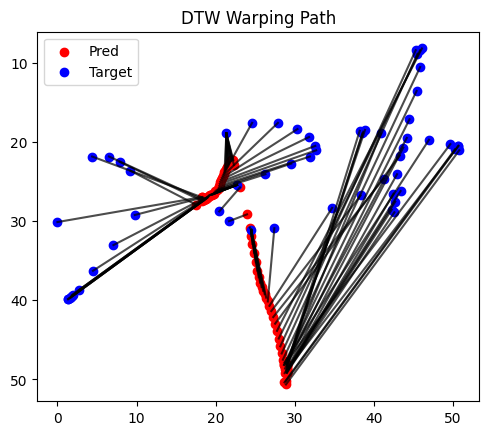

Epoch 50:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 153.7873
   Batch: 100  | Width: 46  | Loss: 263.4369
   Batch: 200  | Width: 56  | Loss: 264.9413
   Batch: 300  | Width: 64  | Loss: 249.8116
   Batch: 400  | Width: 72  | Loss: 270.1723
   Batch: 500  | Width: 78  | Loss: 216.3220
   Batch: 600  | Width: 84  | Loss: 221.8425
   Batch: 700  | Width: 90  | Loss: 296.4621
   Batch: 800  | Width: 96  | Loss: 295.4923
Image id: 11036


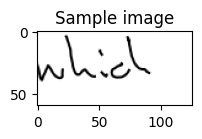

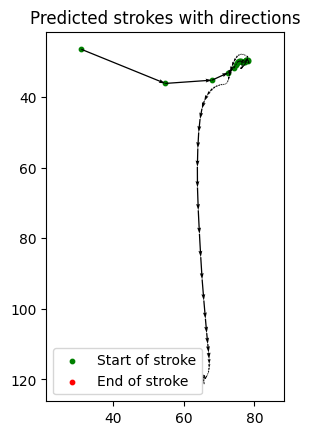

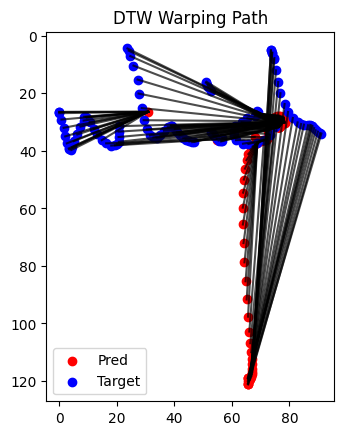

Epoch 51:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 150.3008
   Batch: 100  | Width: 46  | Loss: 269.4773
   Batch: 200  | Width: 56  | Loss: 250.6466
   Batch: 300  | Width: 64  | Loss: 250.2635
   Batch: 400  | Width: 72  | Loss: 265.2014
   Batch: 500  | Width: 78  | Loss: 213.1878
   Batch: 600  | Width: 84  | Loss: 232.5861
   Batch: 700  | Width: 90  | Loss: 281.5299
   Batch: 800  | Width: 96  | Loss: 302.9151
Image id: 38210


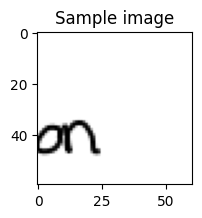

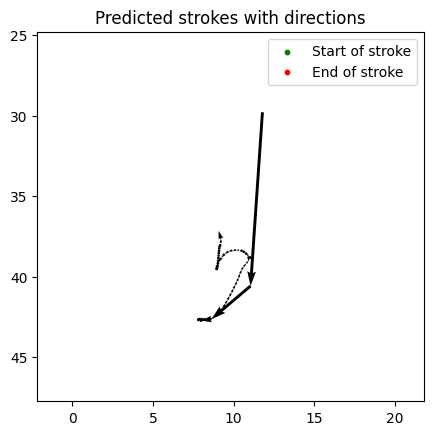

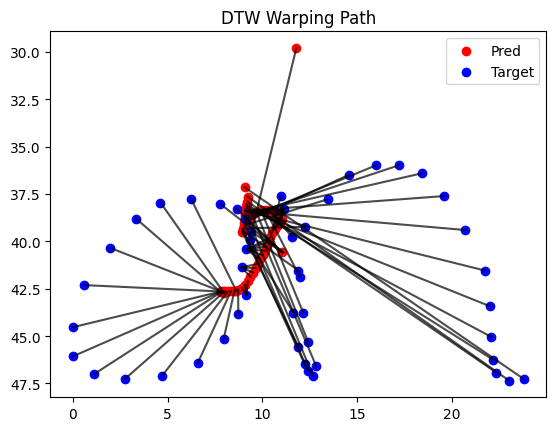

Epoch 52:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 157.6023
   Batch: 100  | Width: 46  | Loss: 266.8501
   Batch: 200  | Width: 56  | Loss: 266.6439
   Batch: 300  | Width: 64  | Loss: 244.1974
   Batch: 400  | Width: 72  | Loss: 261.6256
   Batch: 500  | Width: 78  | Loss: 205.5393
   Batch: 600  | Width: 84  | Loss: 221.2105
   Batch: 700  | Width: 90  | Loss: 280.8229
   Batch: 800  | Width: 96  | Loss: 290.0187
Image id: 12582


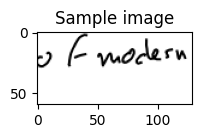

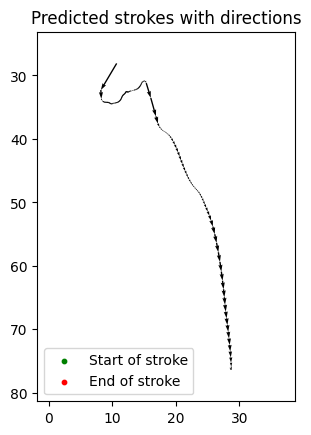

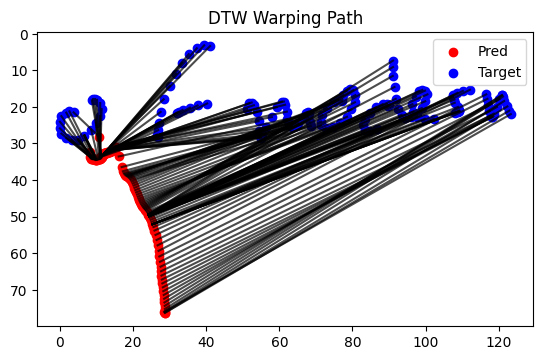

Epoch 53:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 151.8751
   Batch: 100  | Width: 46  | Loss: 270.9405
   Batch: 200  | Width: 56  | Loss: 264.5885
   Batch: 300  | Width: 64  | Loss: 233.9283
   Batch: 400  | Width: 72  | Loss: 268.9833
   Batch: 500  | Width: 78  | Loss: 211.2175
   Batch: 600  | Width: 84  | Loss: 220.5300
   Batch: 700  | Width: 90  | Loss: 283.7521
   Batch: 800  | Width: 96  | Loss: 294.8309
Image id: 4337


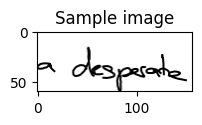

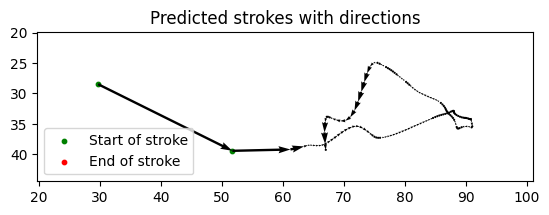

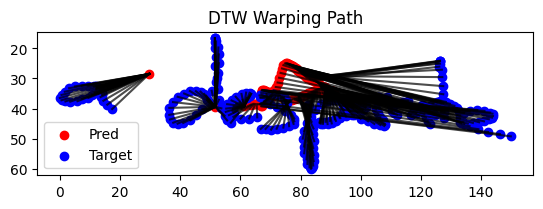

Epoch 54:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 153.7686
   Batch: 100  | Width: 46  | Loss: 265.6199
   Batch: 200  | Width: 56  | Loss: 260.4221
   Batch: 300  | Width: 64  | Loss: 244.9691
   Batch: 400  | Width: 72  | Loss: 267.8335
   Batch: 500  | Width: 78  | Loss: 219.0391
   Batch: 600  | Width: 84  | Loss: 217.6238
   Batch: 700  | Width: 90  | Loss: 279.8703
   Batch: 800  | Width: 96  | Loss: 299.5588
Image id: 35156


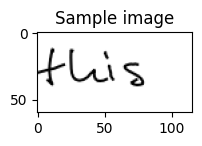

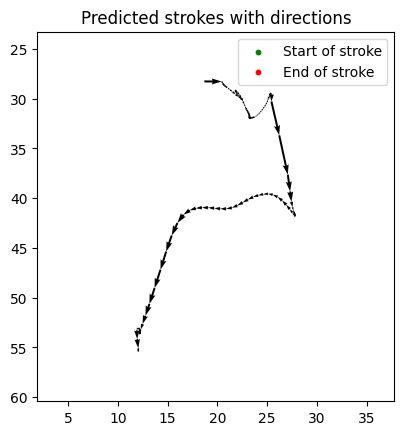

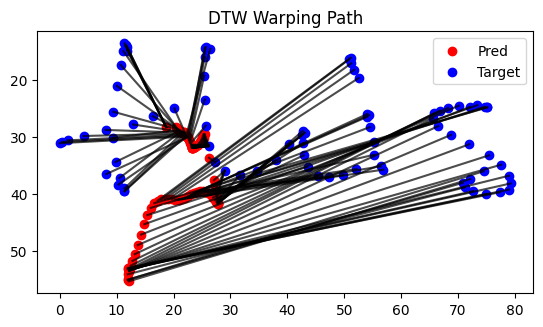

Epoch 55:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 150.5971
   Batch: 100  | Width: 46  | Loss: 265.3392
   Batch: 200  | Width: 56  | Loss: 245.5340
   Batch: 300  | Width: 64  | Loss: 236.5451
   Batch: 400  | Width: 72  | Loss: 271.3345
   Batch: 500  | Width: 78  | Loss: 217.3436
   Batch: 600  | Width: 84  | Loss: 222.0780
   Batch: 700  | Width: 90  | Loss: 275.0531
   Batch: 800  | Width: 96  | Loss: 283.2628
Image id: 16281


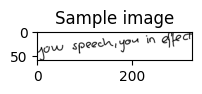

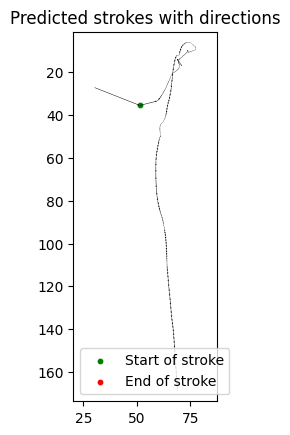

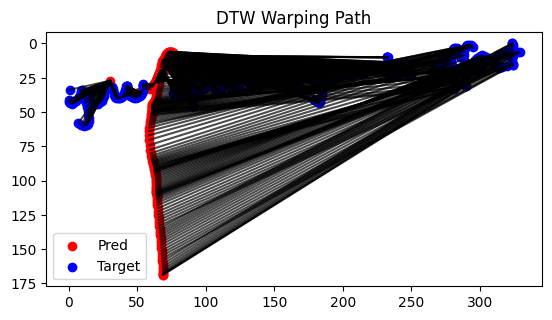

Epoch 56:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 148.1168
   Batch: 100  | Width: 46  | Loss: 271.5178
   Batch: 200  | Width: 56  | Loss: 267.9285


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



   Batch: 500  | Width: 78  | Loss: 225.1497
   Batch: 600  | Width: 84  | Loss: 223.4710
   Batch: 700  | Width: 90  | Loss: 287.0695
   Batch: 800  | Width: 96  | Loss: 295.1701
Image id: 14094


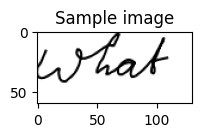

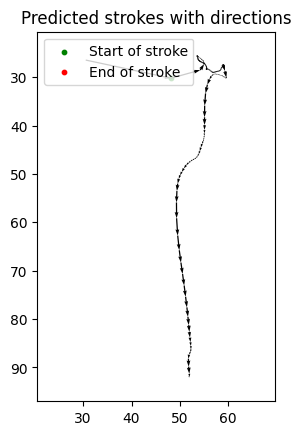

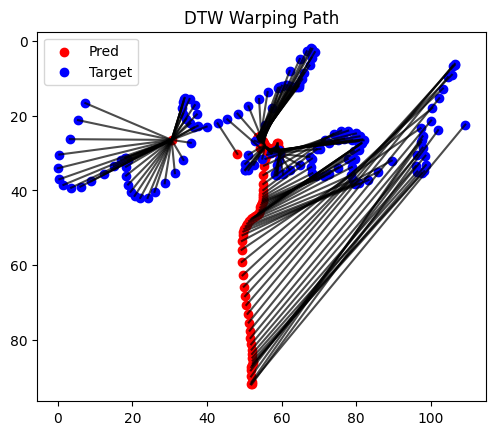

Epoch 57:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 150.9804
   Batch: 100  | Width: 46  | Loss: 268.0301
   Batch: 200  | Width: 56  | Loss: 254.6029
   Batch: 300  | Width: 64  | Loss: 244.9461
   Batch: 400  | Width: 72  | Loss: 274.3505
   Batch: 500  | Width: 78  | Loss: 219.7133
   Batch: 600  | Width: 84  | Loss: 217.9385
   Batch: 700  | Width: 90  | Loss: 286.8935
   Batch: 800  | Width: 96  | Loss: 310.5591
Image id: 25134


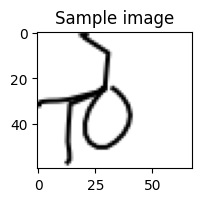

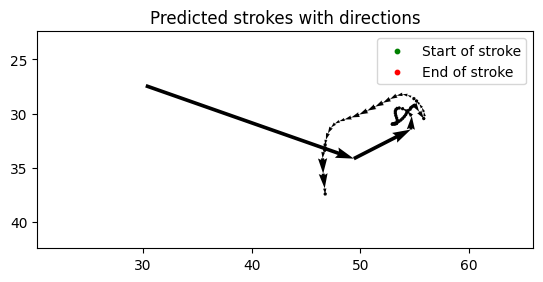

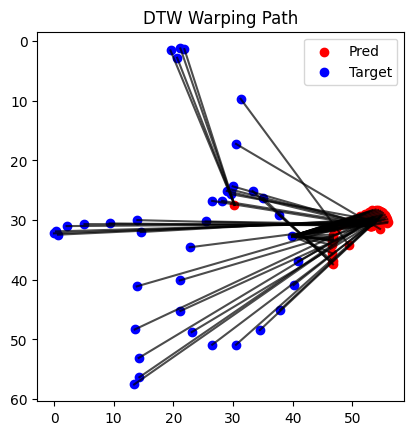

Epoch 58:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 156.7083
   Batch: 100  | Width: 46  | Loss: 253.4617
   Batch: 200  | Width: 56  | Loss: 257.0420
   Batch: 300  | Width: 64  | Loss: 237.0173
   Batch: 400  | Width: 72  | Loss: 278.0883
   Batch: 500  | Width: 78  | Loss: 211.0956
   Batch: 600  | Width: 84  | Loss: 227.0085
   Batch: 700  | Width: 90  | Loss: 284.6686
   Batch: 800  | Width: 96  | Loss: 288.9730
Image id: 35046


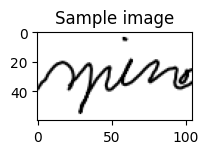

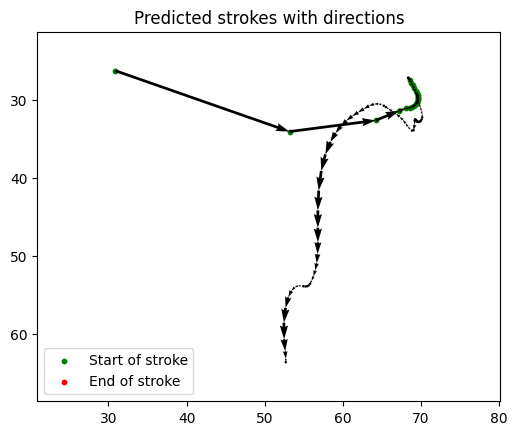

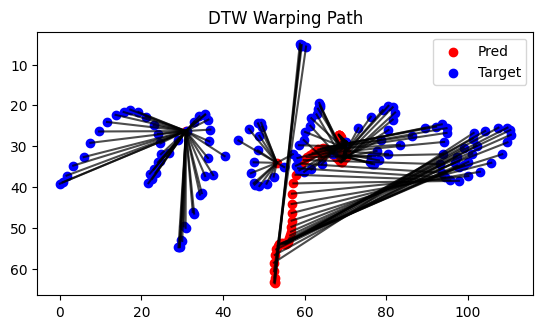

Epoch 59:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 146.9253
   Batch: 100  | Width: 46  | Loss: 265.7559
   Batch: 200  | Width: 56  | Loss: 256.6403
   Batch: 300  | Width: 64  | Loss: 245.3517
   Batch: 400  | Width: 72  | Loss: 259.8562
   Batch: 500  | Width: 78  | Loss: 218.3031


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



   Batch: 800  | Width: 96  | Loss: 296.3572
Image id: 251


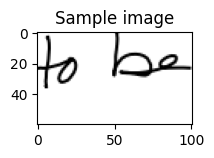

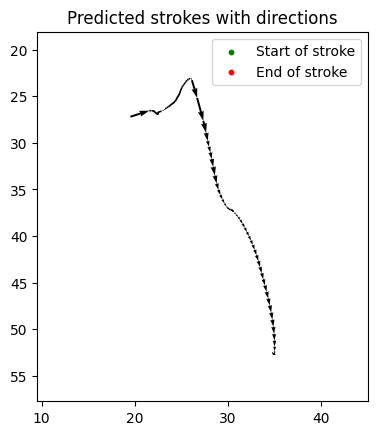

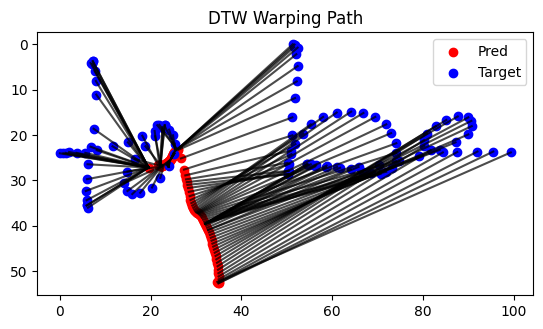

Epoch 60:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 150.1287
   Batch: 100  | Width: 46  | Loss: 262.7318
   Batch: 200  | Width: 56  | Loss: 255.8364
   Batch: 300  | Width: 64  | Loss: 244.0272
   Batch: 400  | Width: 72  | Loss: 262.8039
   Batch: 500  | Width: 78  | Loss: 212.1120
   Batch: 600  | Width: 84  | Loss: 217.7036
   Batch: 700  | Width: 90  | Loss: 279.5805
   Batch: 800  | Width: 96  | Loss: 285.5368
Image id: 12026


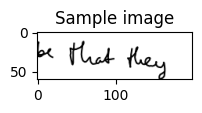

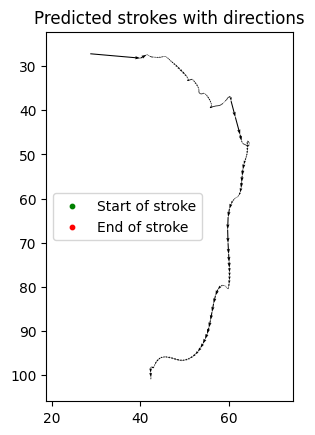

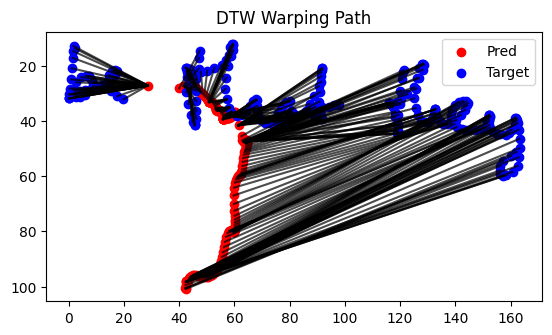

Epoch 61:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 153.4931
   Batch: 100  | Width: 46  | Loss: 261.4729
   Batch: 200  | Width: 56  | Loss: 260.4299
   Batch: 300  | Width: 64  | Loss: 253.3982
   Batch: 400  | Width: 72  | Loss: 273.5762
   Batch: 500  | Width: 78  | Loss: 216.2654
   Batch: 600  | Width: 84  | Loss: 218.6991
   Batch: 700  | Width: 90  | Loss: 281.8243
   Batch: 800  | Width: 96  | Loss: 284.9907
Image id: 30329


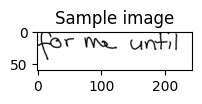

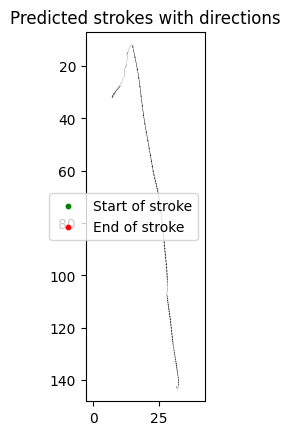

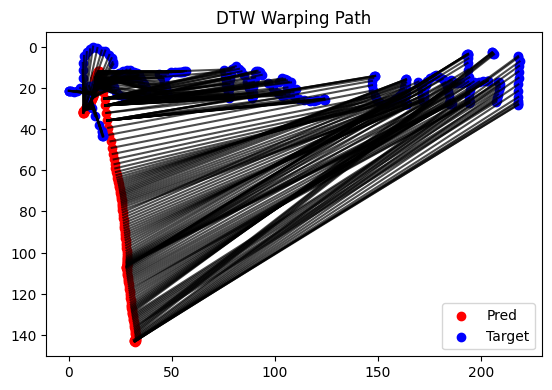

Epoch 62:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 149.2220
   Batch: 100  | Width: 46  | Loss: 276.2805
   Batch: 200  | Width: 56  | Loss: 270.6385
   Batch: 300  | Width: 64  | Loss: 235.4868
   Batch: 400  | Width: 72  | Loss: 265.2735
   Batch: 500  | Width: 78  | Loss: 206.7785
   Batch: 600  | Width: 84  | Loss: 217.5927
   Batch: 700  | Width: 90  | Loss: 277.3342
   Batch: 800  | Width: 96  | Loss: 286.3846
Image id: 31984


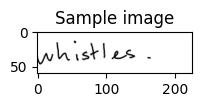

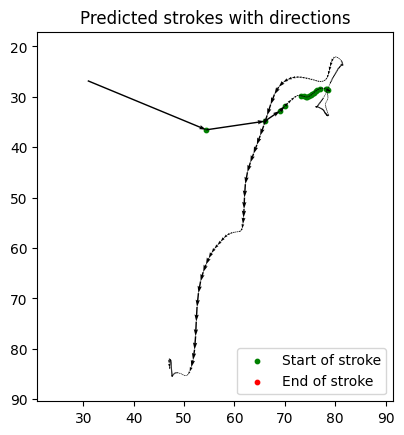

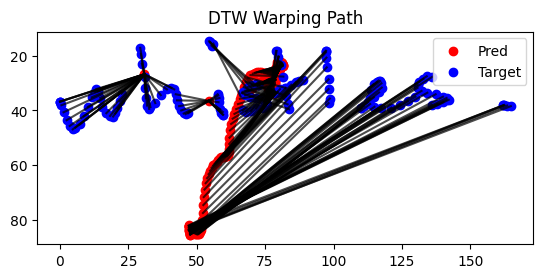

Epoch 63:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 153.2560
   Batch: 100  | Width: 46  | Loss: 268.6205
   Batch: 200  | Width: 56  | Loss: 257.7082
   Batch: 300  | Width: 64  | Loss: 237.2616
   Batch: 400  | Width: 72  | Loss: 259.9594
   Batch: 500  | Width: 78  | Loss: 209.9977
   Batch: 600  | Width: 84  | Loss: 224.8494
   Batch: 700  | Width: 90  | Loss: 285.6791
   Batch: 800  | Width: 96  | Loss: 300.3294
Image id: 32865


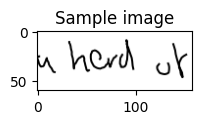

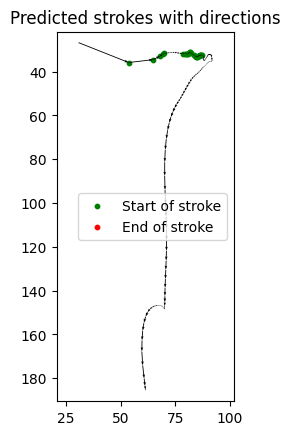

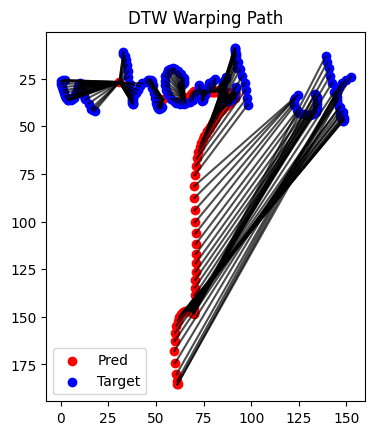

Epoch 64:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 150.8905
   Batch: 100  | Width: 46  | Loss: 267.2432
   Batch: 200  | Width: 56  | Loss: 252.3686
   Batch: 300  | Width: 64  | Loss: 249.2196
   Batch: 400  | Width: 72  | Loss: 274.3655
   Batch: 500  | Width: 78  | Loss: 213.4555
   Batch: 600  | Width: 84  | Loss: 223.0926


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Image id: 14315


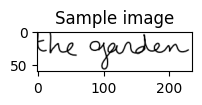

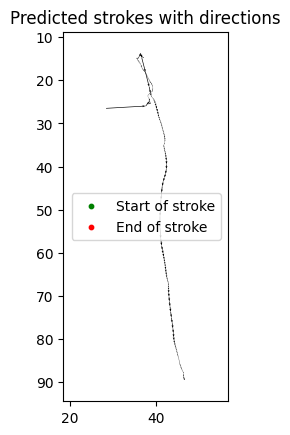

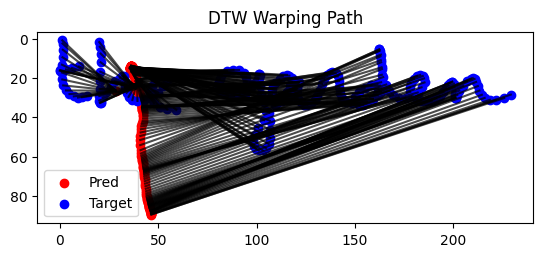

Epoch 65:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 155.7234
   Batch: 100  | Width: 46  | Loss: 268.4279
   Batch: 200  | Width: 56  | Loss: 275.0119
   Batch: 300  | Width: 64  | Loss: 232.7385
   Batch: 400  | Width: 72  | Loss: 261.8668
   Batch: 500  | Width: 78  | Loss: 207.4795
   Batch: 600  | Width: 84  | Loss: 223.9599
   Batch: 700  | Width: 90  | Loss: 276.0947
   Batch: 800  | Width: 96  | Loss: 293.3206
Image id: 30457


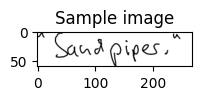

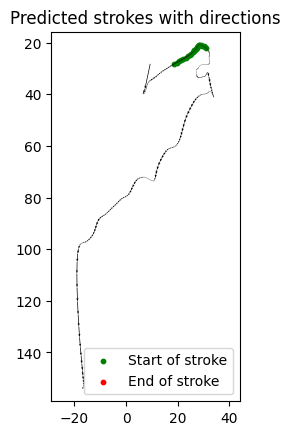

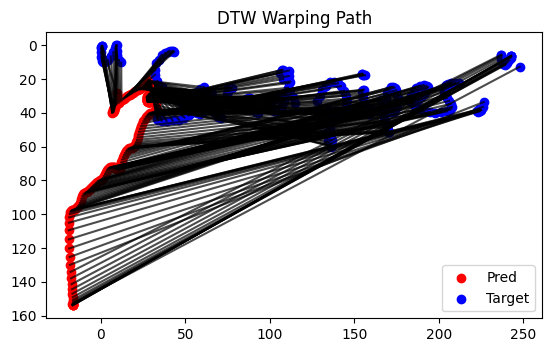

Epoch 66:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 150.4502
   Batch: 100  | Width: 46  | Loss: 264.7164
   Batch: 200  | Width: 56  | Loss: 254.2594
   Batch: 300  | Width: 64  | Loss: 236.1512
   Batch: 400  | Width: 72  | Loss: 258.0880
   Batch: 500  | Width: 78  | Loss: 213.8007
   Batch: 600  | Width: 84  | Loss: 228.5469
   Batch: 700  | Width: 90  | Loss: 283.9107
   Batch: 800  | Width: 96  | Loss: 290.5693
Image id: 35705


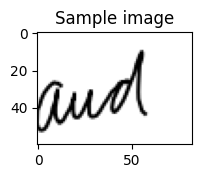

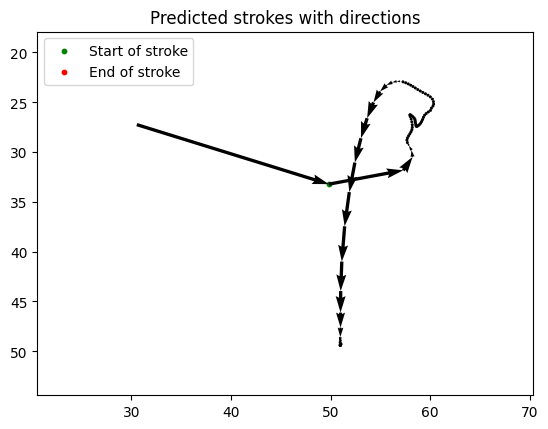

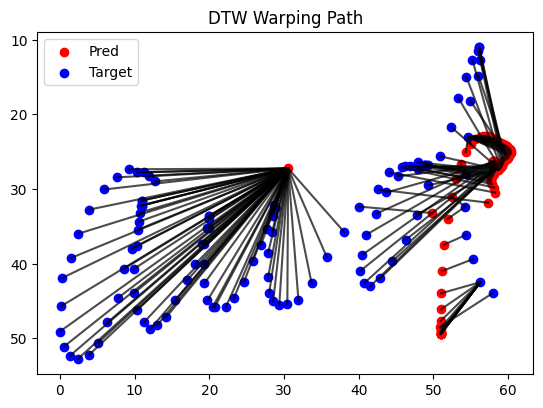

Epoch 67:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 149.2366
   Batch: 100  | Width: 46  | Loss: 260.5324
   Batch: 200  | Width: 56  | Loss: 250.4898
   Batch: 300  | Width: 64  | Loss: 252.2666
   Batch: 400  | Width: 72  | Loss: 265.3883
   Batch: 500  | Width: 78  | Loss: 219.2573
   Batch: 600  | Width: 84  | Loss: 218.4004
   Batch: 700  | Width: 90  | Loss: 274.8378
   Batch: 800  | Width: 96  | Loss: 293.3570
Image id: 18299


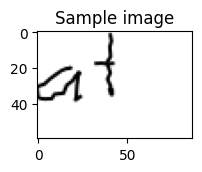

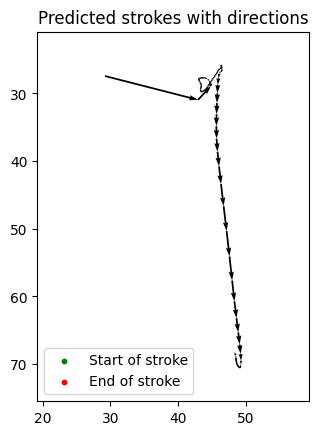

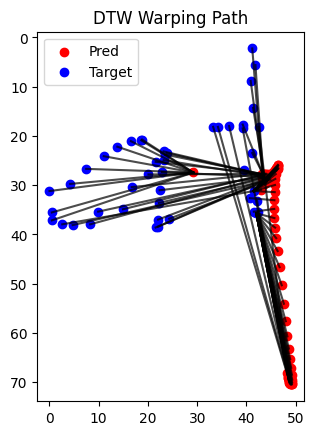

Epoch 68:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 156.8295
   Batch: 100  | Width: 46  | Loss: 266.2135
   Batch: 200  | Width: 56  | Loss: 261.1234
   Batch: 300  | Width: 64  | Loss: 246.0904
   Batch: 400  | Width: 72  | Loss: 273.3323
   Batch: 500  | Width: 78  | Loss: 213.2914
   Batch: 600  | Width: 84  | Loss: 219.6978
   Batch: 700  | Width: 90  | Loss: 283.6303
   Batch: 800  | Width: 96  | Loss: 284.5210
Image id: 35695


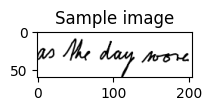

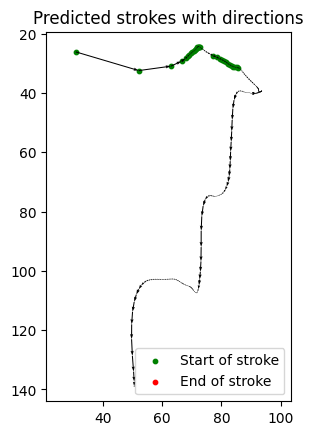

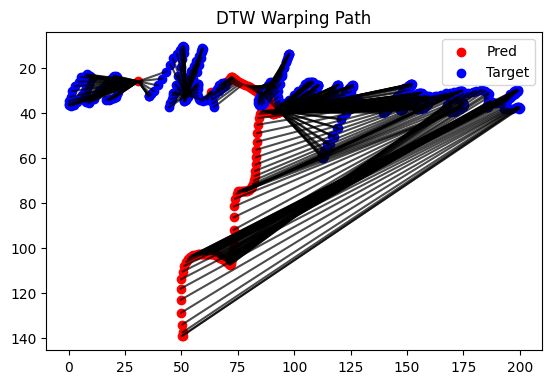

Epoch 69:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 155.0230
   Batch: 100  | Width: 46  | Loss: 265.5344
   Batch: 200  | Width: 56  | Loss: 261.4864
   Batch: 300  | Width: 64  | Loss: 235.8034
   Batch: 400  | Width: 72  | Loss: 266.2681
   Batch: 500  | Width: 78  | Loss: 208.5418
   Batch: 600  | Width: 84  | Loss: 219.4326
   Batch: 700  | Width: 90  | Loss: 284.8934
   Batch: 800  | Width: 96  | Loss: 302.0277
Image id: 34628


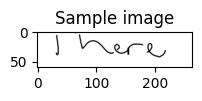

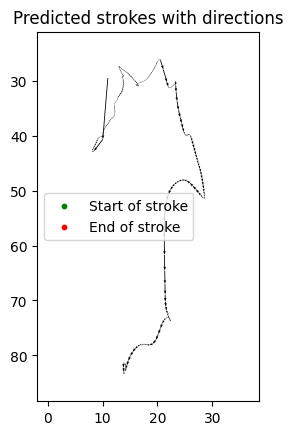

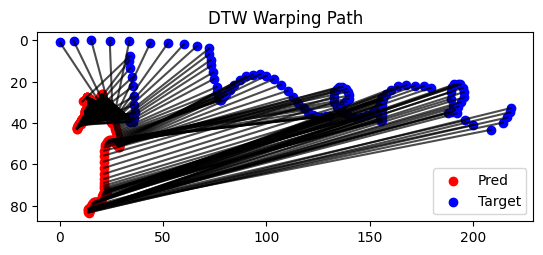

Epoch 70:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 151.3580
   Batch: 100  | Width: 46  | Loss: 264.5211
   Batch: 200  | Width: 56  | Loss: 247.9178
   Batch: 300  | Width: 64  | Loss: 235.6557
   Batch: 400  | Width: 72  | Loss: 271.7521
   Batch: 500  | Width: 78  | Loss: 210.1954
   Batch: 600  | Width: 84  | Loss: 221.1790
   Batch: 700  | Width: 90  | Loss: 294.5871
   Batch: 800  | Width: 96  | Loss: 295.4708
Image id: 15982


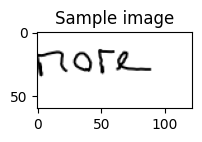

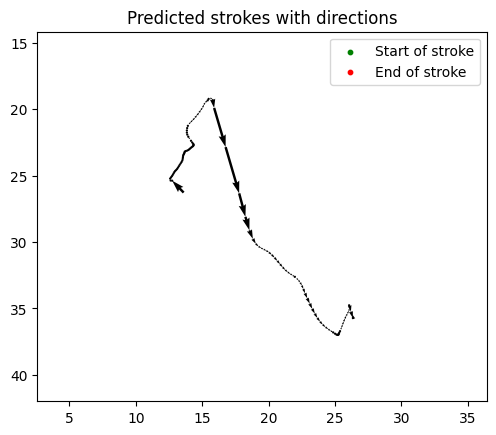

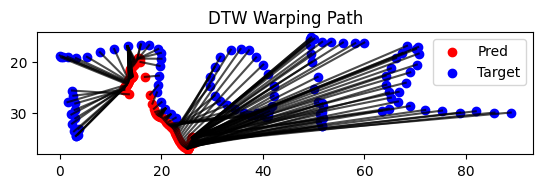

Epoch 71:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 149.0400
   Batch: 100  | Width: 46  | Loss: 275.7394
   Batch: 200  | Width: 56  | Loss: 261.8405
   Batch: 300  | Width: 64  | Loss: 245.7713
   Batch: 400  | Width: 72  | Loss: 258.3109
   Batch: 500  | Width: 78  | Loss: 215.4349
   Batch: 600  | Width: 84  | Loss: 224.0684
   Batch: 700  | Width: 90  | Loss: 287.7221
   Batch: 800  | Width: 96  | Loss: 284.4302
Image id: 16078


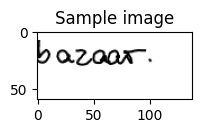

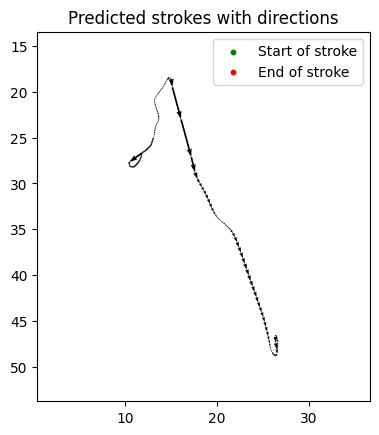

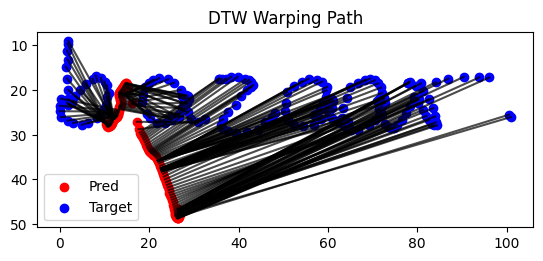

Epoch 72:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 154.3005
   Batch: 100  | Width: 46  | Loss: 263.9702
   Batch: 200  | Width: 56  | Loss: 255.6248
   Batch: 300  | Width: 64  | Loss: 237.7364
   Batch: 400  | Width: 72  | Loss: 269.2374
   Batch: 500  | Width: 78  | Loss: 211.9082
   Batch: 600  | Width: 84  | Loss: 215.7984
   Batch: 700  | Width: 90  | Loss: 283.0315
   Batch: 800  | Width: 96  | Loss: 293.5352
Image id: 22103


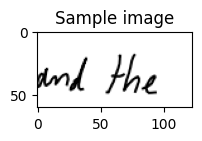

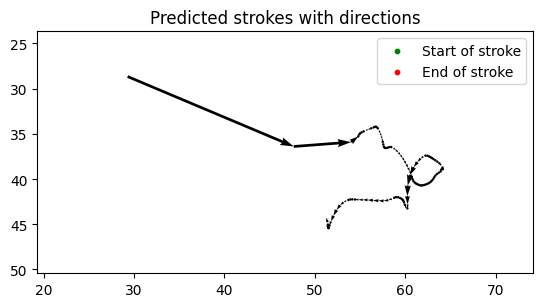

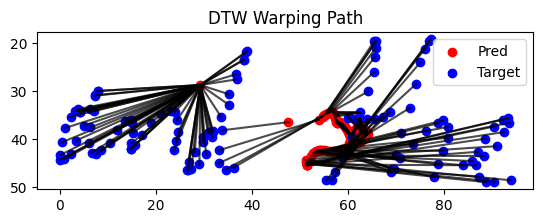

Epoch 73:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 153.6383
   Batch: 100  | Width: 46  | Loss: 268.7633
   Batch: 200  | Width: 56  | Loss: 261.0316
   Batch: 300  | Width: 64  | Loss: 237.3736
   Batch: 400  | Width: 72  | Loss: 265.3595
   Batch: 500  | Width: 78  | Loss: 210.3752
   Batch: 600  | Width: 84  | Loss: 224.8927
   Batch: 700  | Width: 90  | Loss: 287.3866
   Batch: 800  | Width: 96  | Loss: 293.8180
Image id: 12211


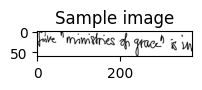

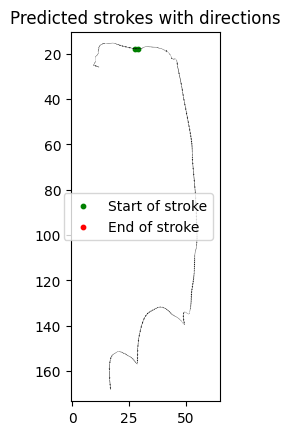

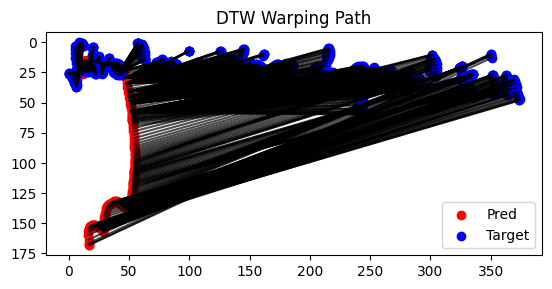

Epoch 74:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 154.7067
   Batch: 100  | Width: 46  | Loss: 265.0612
   Batch: 200  | Width: 56  | Loss: 249.5704
   Batch: 300  | Width: 64  | Loss: 234.5867
   Batch: 400  | Width: 72  | Loss: 268.8145
   Batch: 500  | Width: 78  | Loss: 212.1339
   Batch: 600  | Width: 84  | Loss: 219.1915
   Batch: 700  | Width: 90  | Loss: 276.1852
   Batch: 800  | Width: 96  | Loss: 287.0002
Image id: 18125


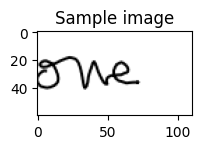

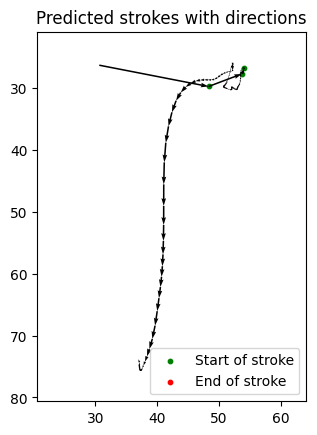

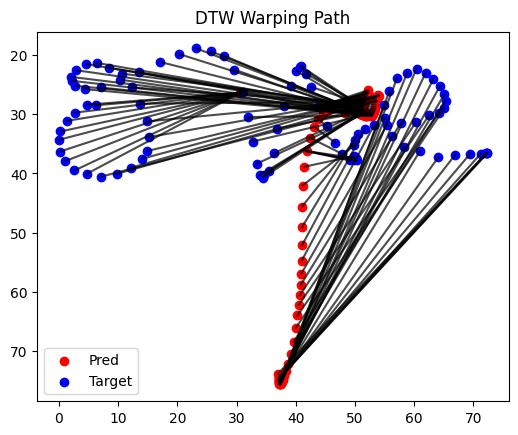

Epoch 75:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 148.6069
   Batch: 100  | Width: 46  | Loss: 273.3527
   Batch: 200  | Width: 56  | Loss: 251.9393
   Batch: 300  | Width: 64  | Loss: 243.9937
   Batch: 400  | Width: 72  | Loss: 274.2111
   Batch: 500  | Width: 78  | Loss: 218.5386
   Batch: 600  | Width: 84  | Loss: 215.0909
   Batch: 700  | Width: 90  | Loss: 284.5643
   Batch: 800  | Width: 96  | Loss: 298.2522
Image id: 16417


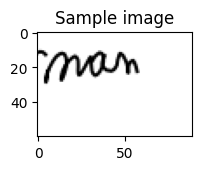

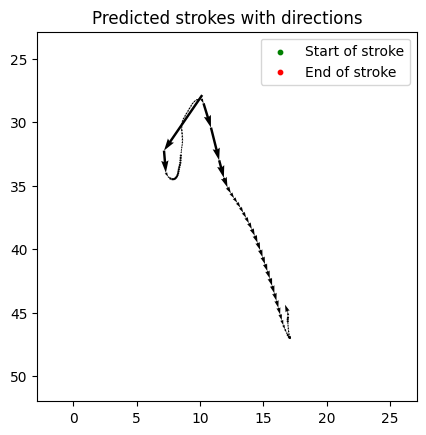

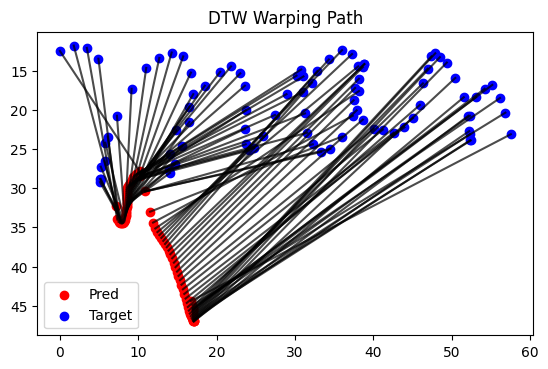

Epoch 76:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 152.2613
   Batch: 100  | Width: 46  | Loss: 263.3156
   Batch: 200  | Width: 56  | Loss: 253.6353
   Batch: 300  | Width: 64  | Loss: 239.4201
   Batch: 400  | Width: 72  | Loss: 268.5989
   Batch: 500  | Width: 78  | Loss: 216.3692
   Batch: 600  | Width: 84  | Loss: 221.6609
   Batch: 700  | Width: 90  | Loss: 284.0285
   Batch: 800  | Width: 96  | Loss: 297.2773
Image id: 14214


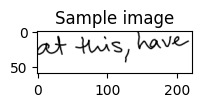

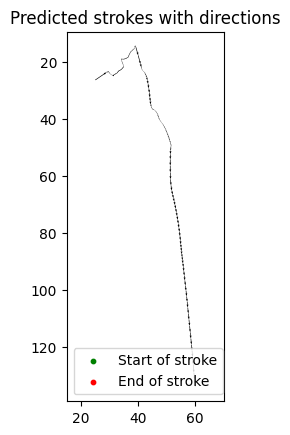

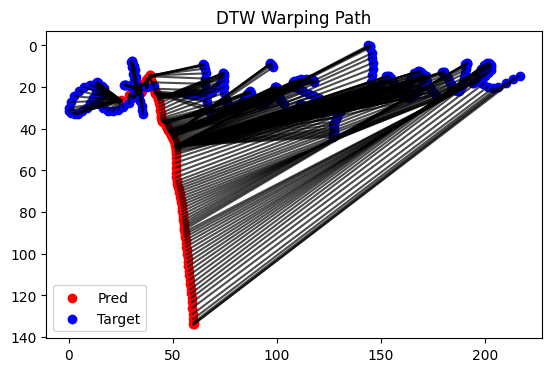

Epoch 77:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 148.4137
   Batch: 100  | Width: 46  | Loss: 267.8310
   Batch: 200  | Width: 56  | Loss: 271.6634
   Batch: 300  | Width: 64  | Loss: 241.1127
   Batch: 400  | Width: 72  | Loss: 265.4353
   Batch: 500  | Width: 78  | Loss: 218.4496
   Batch: 600  | Width: 84  | Loss: 229.7502
   Batch: 700  | Width: 90  | Loss: 282.0819
   Batch: 800  | Width: 96  | Loss: 300.5249
Image id: 14178


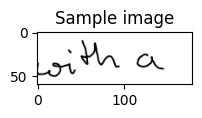

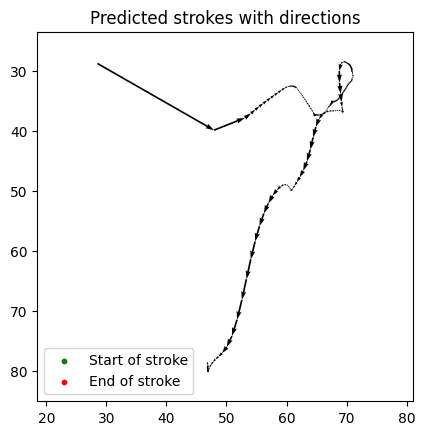

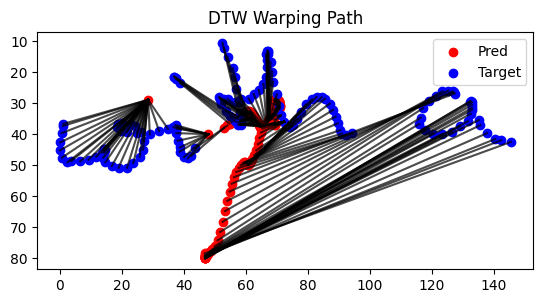

Epoch 78:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 148.8001
   Batch: 100  | Width: 46  | Loss: 271.3341
   Batch: 200  | Width: 56  | Loss: 263.4912
   Batch: 300  | Width: 64  | Loss: 240.4230
   Batch: 400  | Width: 72  | Loss: 280.7627
   Batch: 500  | Width: 78  | Loss: 209.1232
   Batch: 600  | Width: 84  | Loss: 227.1885
   Batch: 700  | Width: 90  | Loss: 282.1932
   Batch: 800  | Width: 96  | Loss: 292.9976
Image id: 28931


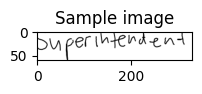

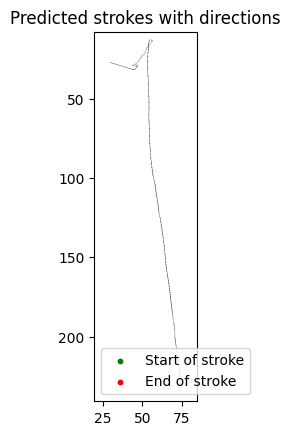

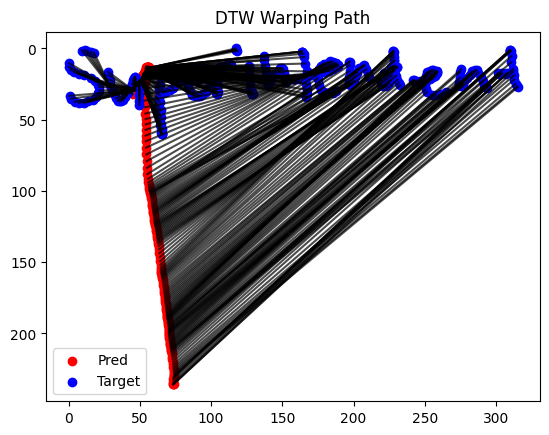

Epoch 79:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 151.4528
   Batch: 100  | Width: 46  | Loss: 263.7282
   Batch: 200  | Width: 56  | Loss: 269.6973
   Batch: 300  | Width: 64  | Loss: 242.1338
   Batch: 400  | Width: 72  | Loss: 264.7459
   Batch: 500  | Width: 78  | Loss: 209.4266
   Batch: 600  | Width: 84  | Loss: 219.6894
   Batch: 700  | Width: 90  | Loss: 282.4301
   Batch: 800  | Width: 96  | Loss: 288.7243
Image id: 12564


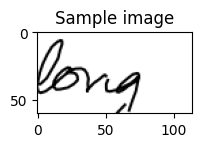

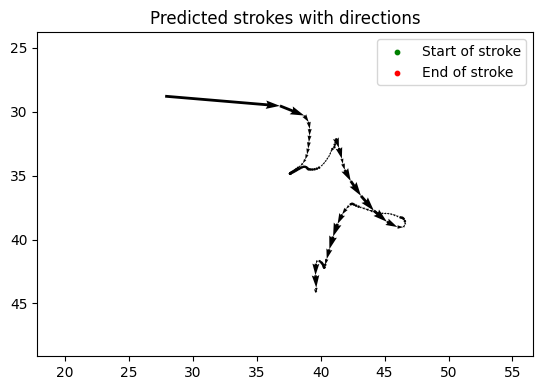

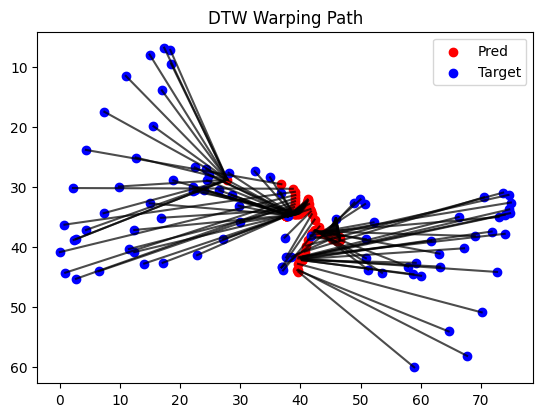

Epoch 80:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 150.1622
   Batch: 100  | Width: 46  | Loss: 269.8436
   Batch: 200  | Width: 56  | Loss: 251.7153
   Batch: 300  | Width: 64  | Loss: 242.5764
   Batch: 400  | Width: 72  | Loss: 269.8155
   Batch: 500  | Width: 78  | Loss: 218.9784
   Batch: 600  | Width: 84  | Loss: 225.7813
   Batch: 700  | Width: 90  | Loss: 281.4395
   Batch: 800  | Width: 96  | Loss: 293.8128
Image id: 22813


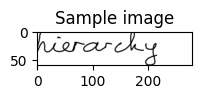

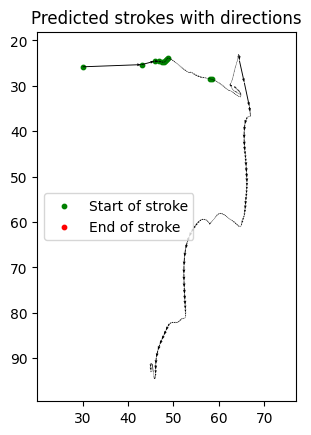

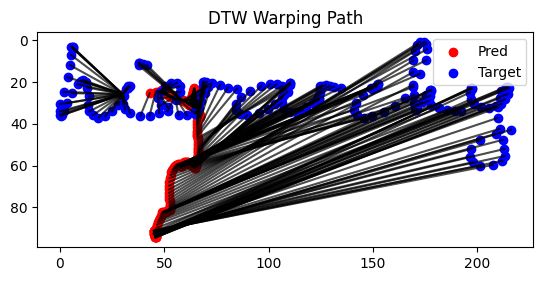

Epoch 81:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 151.5597
   Batch: 100  | Width: 46  | Loss: 269.2249
   Batch: 200  | Width: 56  | Loss: 266.3150
   Batch: 300  | Width: 64  | Loss: 247.8236
   Batch: 400  | Width: 72  | Loss: 276.6485
   Batch: 500  | Width: 78  | Loss: 218.2099
   Batch: 600  | Width: 84  | Loss: 217.0573
   Batch: 700  | Width: 90  | Loss: 288.6897
   Batch: 800  | Width: 96  | Loss: 315.0496
Image id: 26160


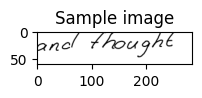

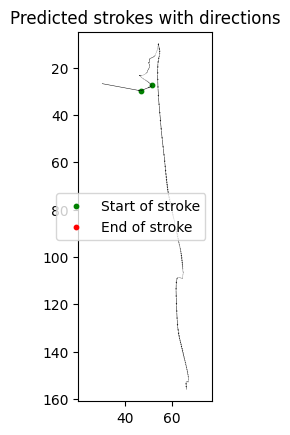

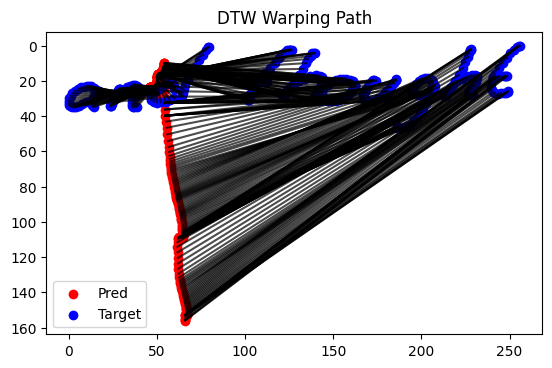

Epoch 82:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 150.7326
   Batch: 100  | Width: 46  | Loss: 266.4745
   Batch: 200  | Width: 56  | Loss: 257.0290
   Batch: 300  | Width: 64  | Loss: 239.8955
   Batch: 400  | Width: 72  | Loss: 273.0266
   Batch: 500  | Width: 78  | Loss: 209.8585
   Batch: 600  | Width: 84  | Loss: 222.4836
   Batch: 700  | Width: 90  | Loss: 288.5682
   Batch: 800  | Width: 96  | Loss: 298.7906
Image id: 33337


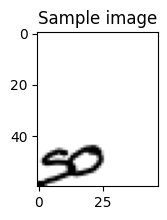

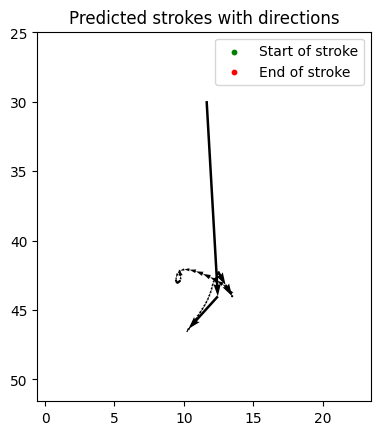

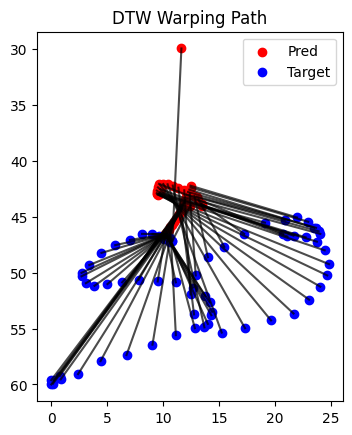

Epoch 83:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 153.0585
   Batch: 100  | Width: 46  | Loss: 268.9044
   Batch: 200  | Width: 56  | Loss: 255.1986
   Batch: 300  | Width: 64  | Loss: 242.2699
   Batch: 400  | Width: 72  | Loss: 264.4830
   Batch: 500  | Width: 78  | Loss: 221.0649
   Batch: 600  | Width: 84  | Loss: 227.8257
   Batch: 700  | Width: 90  | Loss: 278.1124
   Batch: 800  | Width: 96  | Loss: 283.0512
Image id: 39704


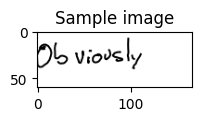

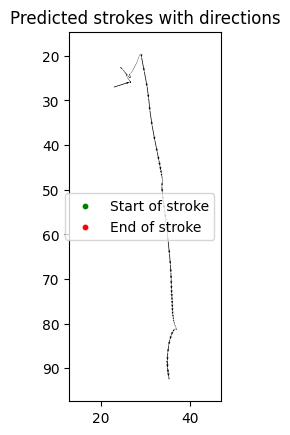

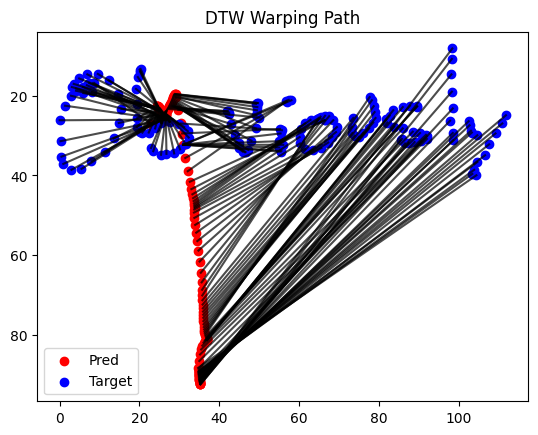

Epoch 84:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 150.1202
   Batch: 100  | Width: 46  | Loss: 271.3748
   Batch: 200  | Width: 56  | Loss: 259.1452
   Batch: 300  | Width: 64  | Loss: 240.6350
   Batch: 400  | Width: 72  | Loss: 268.0178
   Batch: 500  | Width: 78  | Loss: 215.3673
   Batch: 600  | Width: 84  | Loss: 216.7798
   Batch: 700  | Width: 90  | Loss: 275.0458
   Batch: 800  | Width: 96  | Loss: 310.4562
Image id: 14773


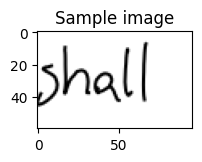

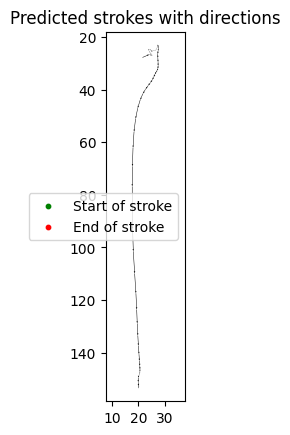

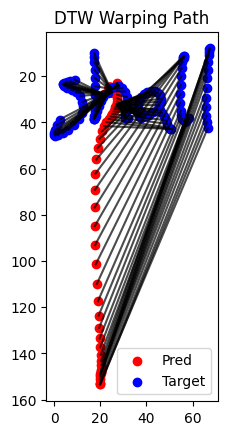

Epoch 85:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 155.7550
   Batch: 100  | Width: 46  | Loss: 271.7333
   Batch: 200  | Width: 56  | Loss: 263.6761
   Batch: 300  | Width: 64  | Loss: 234.1726
   Batch: 400  | Width: 72  | Loss: 259.0450
   Batch: 500  | Width: 78  | Loss: 220.7001
   Batch: 600  | Width: 84  | Loss: 214.3193
   Batch: 700  | Width: 90  | Loss: 281.3535
   Batch: 800  | Width: 96  | Loss: 317.2888
Image id: 35410


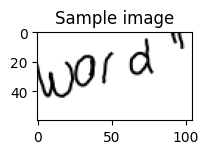

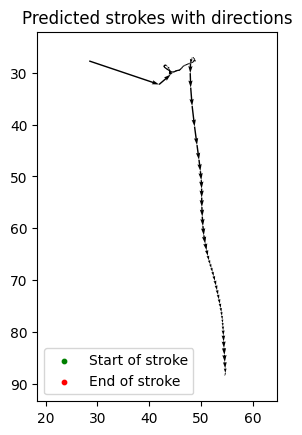

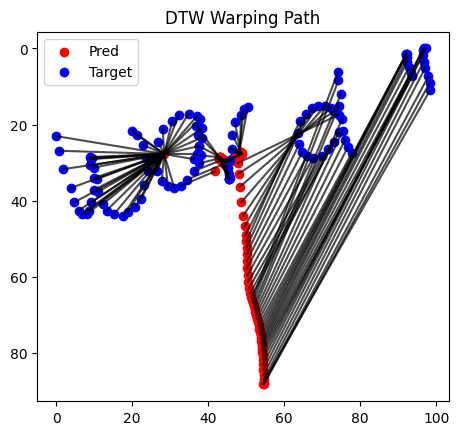

Epoch 86:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 155.7209
   Batch: 100  | Width: 46  | Loss: 265.6636
   Batch: 200  | Width: 56  | Loss: 264.9402
   Batch: 300  | Width: 64  | Loss: 244.2351
   Batch: 400  | Width: 72  | Loss: 261.9107
   Batch: 500  | Width: 78  | Loss: 214.5009
   Batch: 600  | Width: 84  | Loss: 217.9800
   Batch: 700  | Width: 90  | Loss: 282.6764
   Batch: 800  | Width: 96  | Loss: 295.8087
Image id: 14689


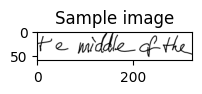

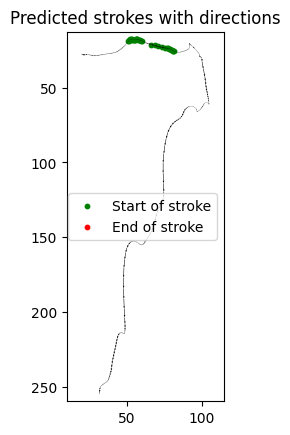

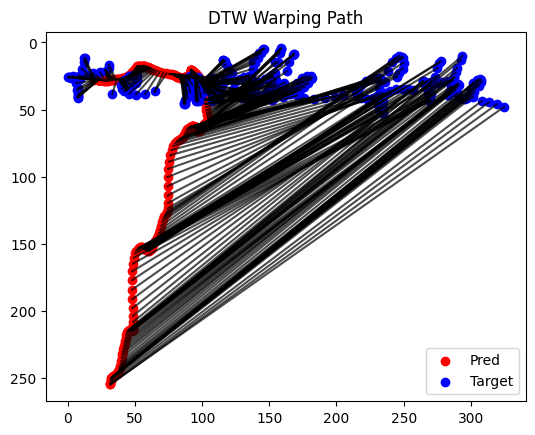

Epoch 87:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 150.4373
   Batch: 100  | Width: 46  | Loss: 262.4410
   Batch: 200  | Width: 56  | Loss: 262.9592
   Batch: 300  | Width: 64  | Loss: 238.3211
   Batch: 400  | Width: 72  | Loss: 263.6577
   Batch: 500  | Width: 78  | Loss: 209.9283
   Batch: 600  | Width: 84  | Loss: 221.3703
   Batch: 700  | Width: 90  | Loss: 271.4176
   Batch: 800  | Width: 96  | Loss: 307.5516
Image id: 34828


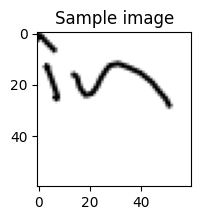

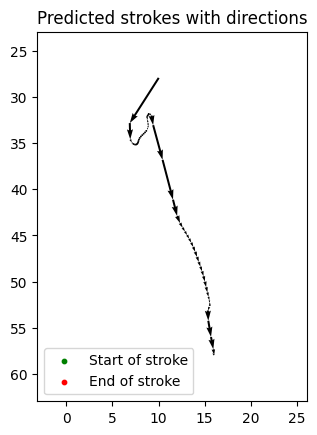

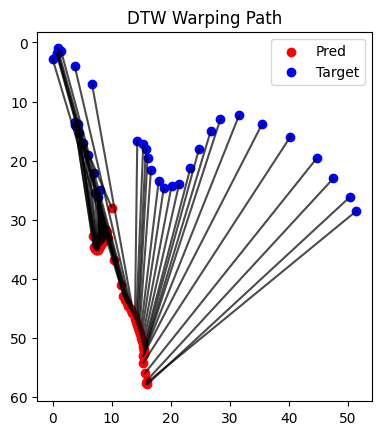

Epoch 88:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 148.3622
   Batch: 100  | Width: 46  | Loss: 260.9157
   Batch: 200  | Width: 56  | Loss: 260.1189
   Batch: 300  | Width: 64  | Loss: 243.1602
   Batch: 400  | Width: 72  | Loss: 267.9240
   Batch: 500  | Width: 78  | Loss: 216.6375
   Batch: 600  | Width: 84  | Loss: 222.3627
   Batch: 700  | Width: 90  | Loss: 284.4763
   Batch: 800  | Width: 96  | Loss: 299.8573
Image id: 22625


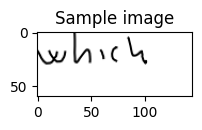

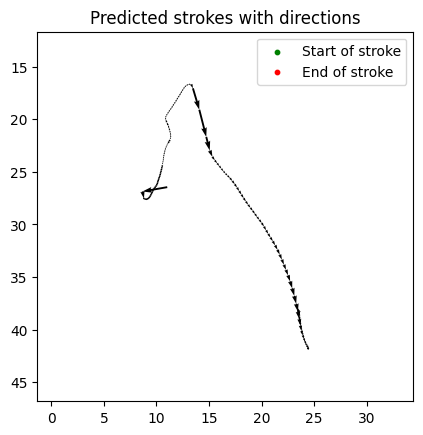

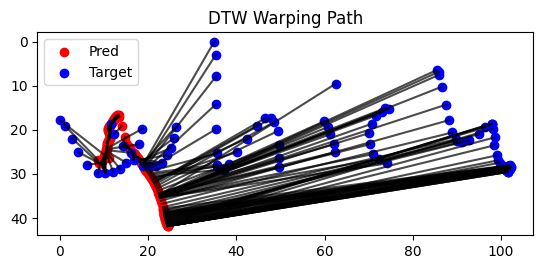

Epoch 89:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 148.7930
   Batch: 100  | Width: 46  | Loss: 268.0732
   Batch: 200  | Width: 56  | Loss: 262.6795
   Batch: 300  | Width: 64  | Loss: 239.0615
   Batch: 400  | Width: 72  | Loss: 259.4873
   Batch: 500  | Width: 78  | Loss: 203.9476
   Batch: 600  | Width: 84  | Loss: 216.9552
   Batch: 700  | Width: 90  | Loss: 281.6952
   Batch: 800  | Width: 96  | Loss: 293.9365
Image id: 12854


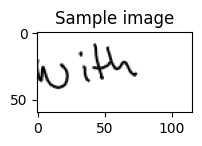

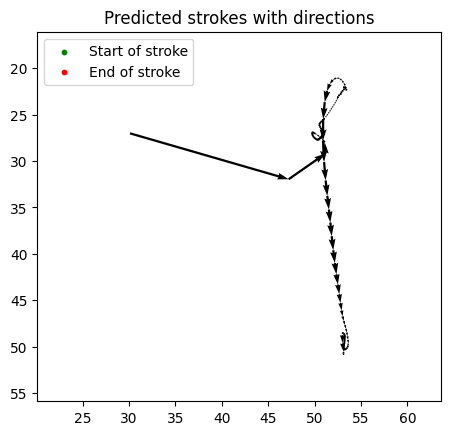

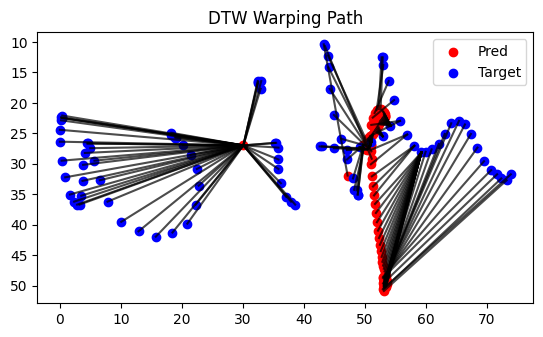

Epoch 90:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 146.3683
   Batch: 100  | Width: 46  | Loss: 267.4214
   Batch: 200  | Width: 56  | Loss: 260.1306
   Batch: 300  | Width: 64  | Loss: 239.3145
   Batch: 400  | Width: 72  | Loss: 268.6110
   Batch: 500  | Width: 78  | Loss: 215.0566
   Batch: 600  | Width: 84  | Loss: 226.6018
   Batch: 700  | Width: 90  | Loss: 282.5465
   Batch: 800  | Width: 96  | Loss: 282.8331
Image id: 31447


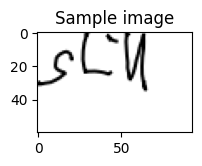

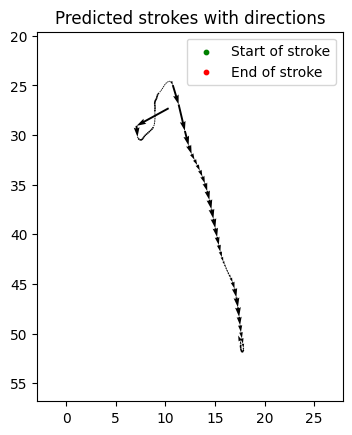

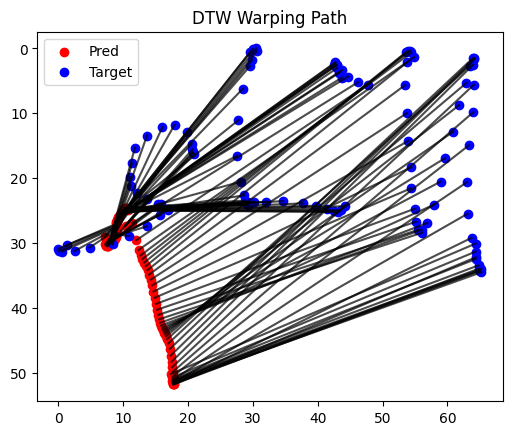

Epoch 91:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 153.9348
   Batch: 100  | Width: 46  | Loss: 271.3577
   Batch: 200  | Width: 56  | Loss: 246.7031
   Batch: 300  | Width: 64  | Loss: 255.2668
   Batch: 400  | Width: 72  | Loss: 274.9455
   Batch: 500  | Width: 78  | Loss: 221.1975
   Batch: 600  | Width: 84  | Loss: 220.3528
   Batch: 700  | Width: 90  | Loss: 281.6303
   Batch: 800  | Width: 96  | Loss: 293.6202
Image id: 37183


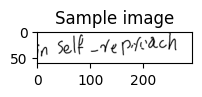

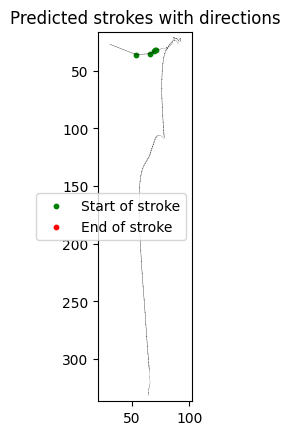

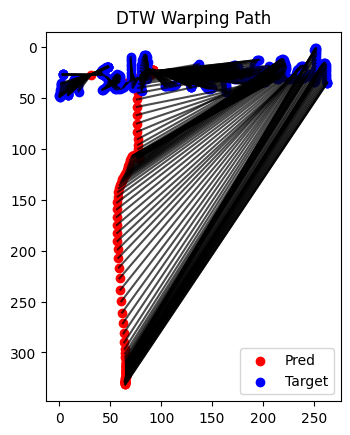

Epoch 92:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 150.1751
   Batch: 100  | Width: 46  | Loss: 259.5744
   Batch: 200  | Width: 56  | Loss: 256.2318
   Batch: 300  | Width: 64  | Loss: 247.5803
   Batch: 400  | Width: 72  | Loss: 273.3707
   Batch: 500  | Width: 78  | Loss: 221.0124
   Batch: 600  | Width: 84  | Loss: 229.0445
   Batch: 700  | Width: 90  | Loss: 285.7437
   Batch: 800  | Width: 96  | Loss: 310.6564
Image id: 27165


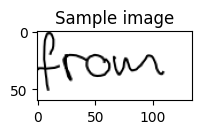

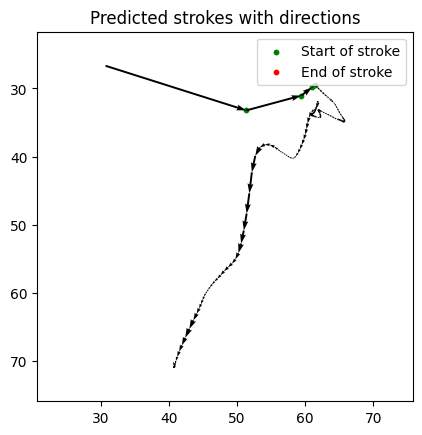

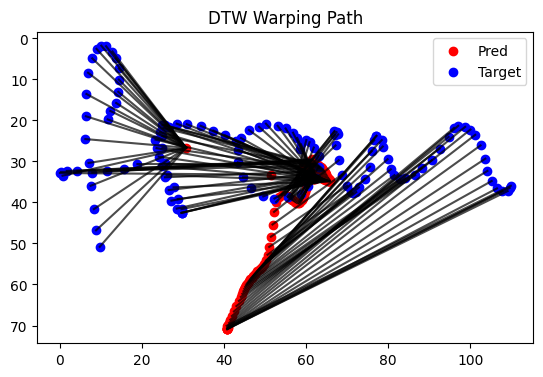

Epoch 93:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 151.0385
   Batch: 100  | Width: 46  | Loss: 275.4719
   Batch: 200  | Width: 56  | Loss: 253.2338
   Batch: 300  | Width: 64  | Loss: 244.1599
   Batch: 400  | Width: 72  | Loss: 263.0400
   Batch: 500  | Width: 78  | Loss: 216.7307
   Batch: 600  | Width: 84  | Loss: 218.5902
   Batch: 700  | Width: 90  | Loss: 287.7594
   Batch: 800  | Width: 96  | Loss: 300.2457
Image id: 6100


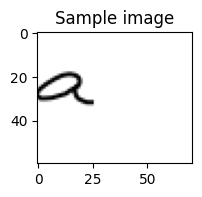

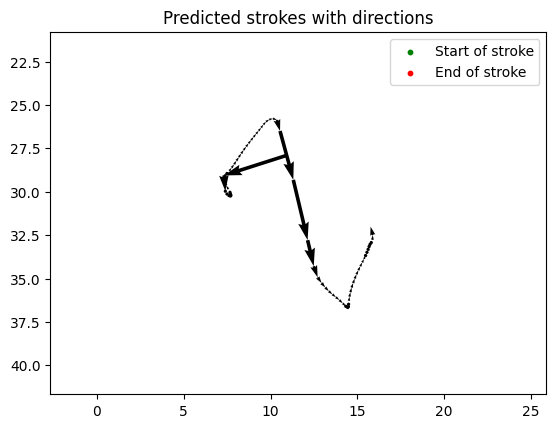

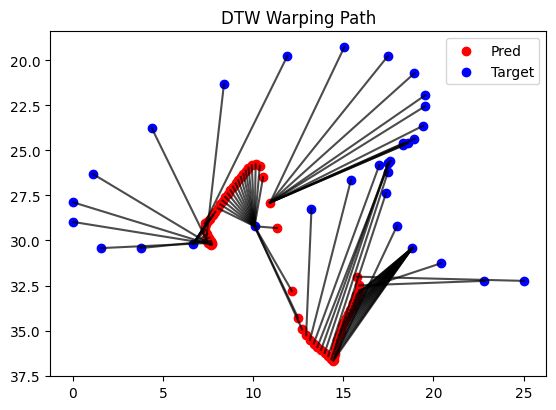

Epoch 94:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 152.8900
   Batch: 100  | Width: 46  | Loss: 264.9749
   Batch: 200  | Width: 56  | Loss: 255.4208
   Batch: 300  | Width: 64  | Loss: 233.2282
   Batch: 400  | Width: 72  | Loss: 259.4199
   Batch: 500  | Width: 78  | Loss: 213.1418
   Batch: 600  | Width: 84  | Loss: 229.4069
   Batch: 700  | Width: 90  | Loss: 285.8161
   Batch: 800  | Width: 96  | Loss: 288.0776
Image id: 6744


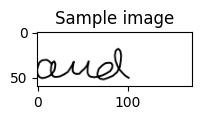

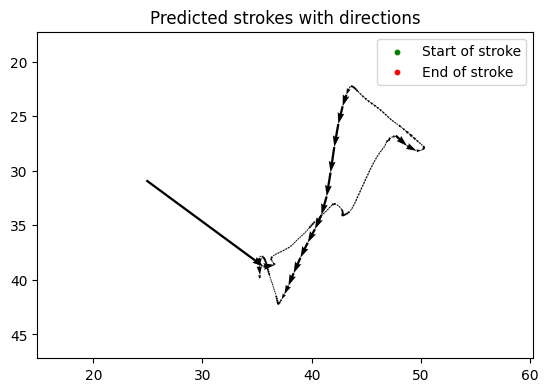

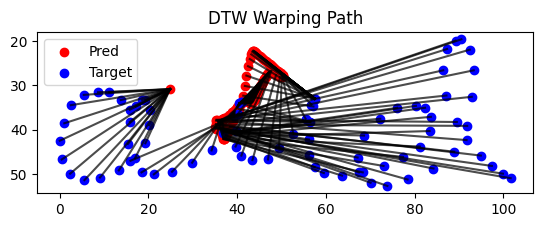

Epoch 95:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 155.3007
   Batch: 100  | Width: 46  | Loss: 257.8147
   Batch: 200  | Width: 56  | Loss: 253.0429
   Batch: 300  | Width: 64  | Loss: 246.0172
   Batch: 400  | Width: 72  | Loss: 268.1220
   Batch: 500  | Width: 78  | Loss: 219.1315
   Batch: 600  | Width: 84  | Loss: 218.9284
   Batch: 700  | Width: 90  | Loss: 284.2776
   Batch: 800  | Width: 96  | Loss: 290.4737
Image id: 1588


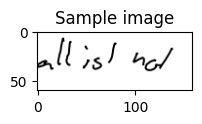

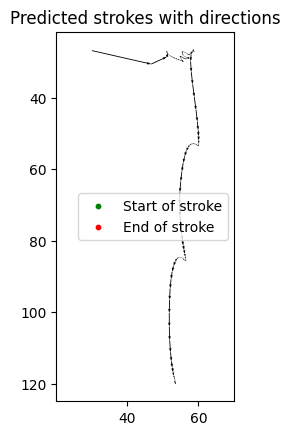

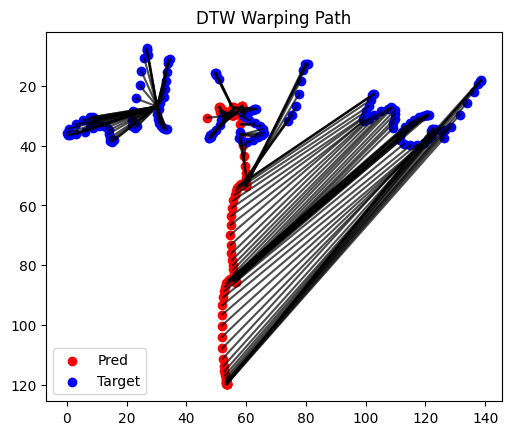

Epoch 96:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 154.8999
   Batch: 100  | Width: 46  | Loss: 256.5835
   Batch: 200  | Width: 56  | Loss: 261.2199
   Batch: 300  | Width: 64  | Loss: 235.6111
   Batch: 400  | Width: 72  | Loss: 272.4772
   Batch: 500  | Width: 78  | Loss: 218.6170
   Batch: 600  | Width: 84  | Loss: 224.2407
   Batch: 700  | Width: 90  | Loss: 281.0957
   Batch: 800  | Width: 96  | Loss: 300.7989
Image id: 34518


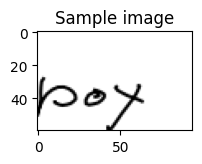

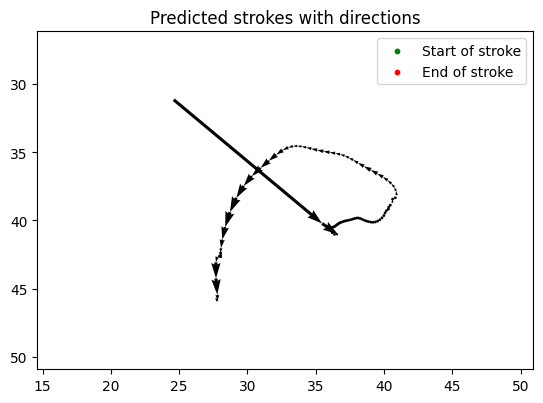

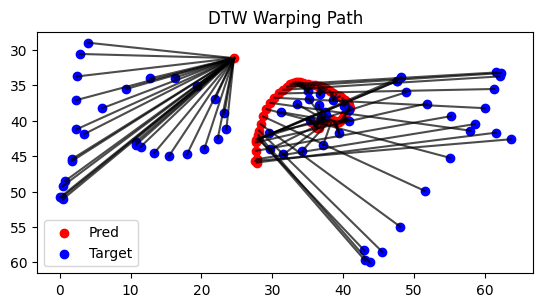

Epoch 97:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 149.4974
   Batch: 100  | Width: 46  | Loss: 267.5345
   Batch: 200  | Width: 56  | Loss: 263.8901
   Batch: 300  | Width: 64  | Loss: 236.5352
   Batch: 400  | Width: 72  | Loss: 265.1051
   Batch: 500  | Width: 78  | Loss: 221.2335
   Batch: 600  | Width: 84  | Loss: 222.2629
   Batch: 700  | Width: 90  | Loss: 292.2001
   Batch: 800  | Width: 96  | Loss: 287.1346
Image id: 8345


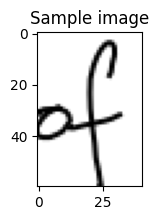

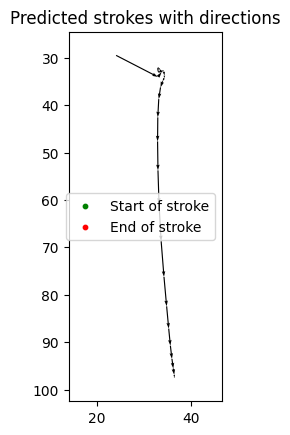

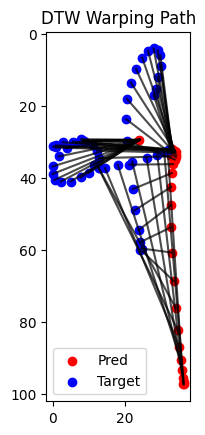

Epoch 98:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 150.2769
   Batch: 100  | Width: 46  | Loss: 265.2328
   Batch: 200  | Width: 56  | Loss: 246.7623
   Batch: 300  | Width: 64  | Loss: 249.3362
   Batch: 400  | Width: 72  | Loss: 276.7099
   Batch: 500  | Width: 78  | Loss: 213.8915
   Batch: 600  | Width: 84  | Loss: 222.7724
   Batch: 700  | Width: 90  | Loss: 280.8950
   Batch: 800  | Width: 96  | Loss: 291.7450
Image id: 4542


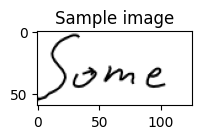

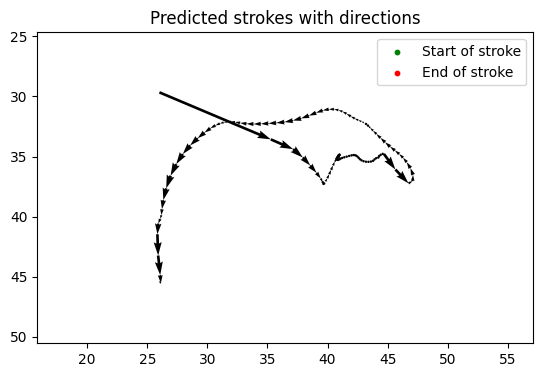

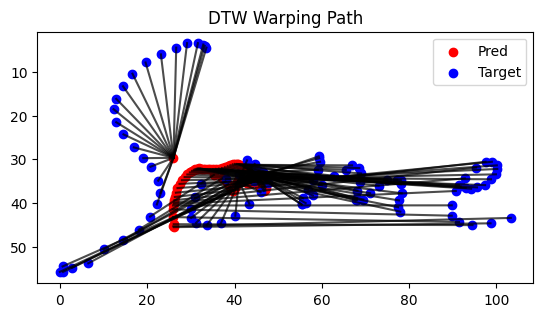

Epoch 99:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 154.5337
   Batch: 100  | Width: 46  | Loss: 267.1333
   Batch: 200  | Width: 56  | Loss: 273.3177
   Batch: 300  | Width: 64  | Loss: 245.3883
   Batch: 400  | Width: 72  | Loss: 264.4963
   Batch: 500  | Width: 78  | Loss: 219.6648
   Batch: 600  | Width: 84  | Loss: 227.0934
   Batch: 700  | Width: 90  | Loss: 290.6334
   Batch: 800  | Width: 96  | Loss: 293.5389
Image id: 16195


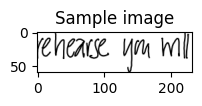

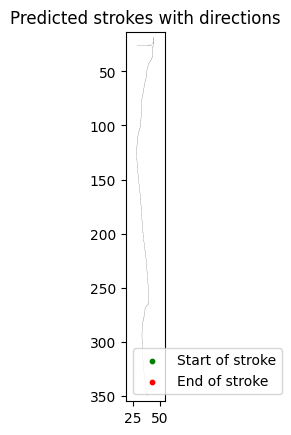

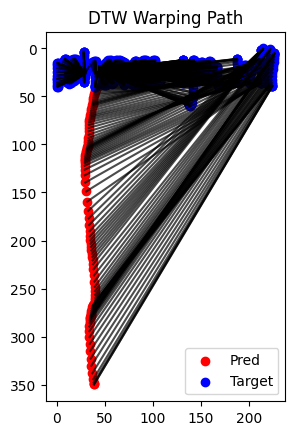

Epoch 100:   0%|          | 0/893 [00:00<?, ?it/s]

   Batch: 0    | Width: 6   | Loss: 153.6482
   Batch: 100  | Width: 46  | Loss: 260.8491
   Batch: 200  | Width: 56  | Loss: 269.7573
   Batch: 300  | Width: 64  | Loss: 245.5057
   Batch: 400  | Width: 72  | Loss: 270.9732
   Batch: 500  | Width: 78  | Loss: 224.6636
   Batch: 600  | Width: 84  | Loss: 223.7645
   Batch: 700  | Width: 90  | Loss: 295.3632
   Batch: 800  | Width: 96  | Loss: 305.3929


In [25]:
# Fitting the model
losses = model_fit(model, dataloader, loss_function, optimizer, scheduler, num_epochs, device, checkpoint_interval, root_dir, plot=True)